<a href="https://colab.research.google.com/github/diamondleng/CCUS/blob/main/BOEM_DA_of_CO2_Storage_Capacity_in_GOM.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Northern GOM CO2 Storage Capacity Data Analytics Project (Pleistocene, Pliocene and Miocene and before OIL and GAS Reservoirs) - BOEM database version


In this project, we apply data analytics methods to assess the storage capacity of each field in GOM and rank the influencing factors

## Data Entry Explanation:


![image.png](attachment:5e43765b-6e0d-4b44-8910-362e9d6f135f.png)

## Abbreviations


![image.png](attachment:60055abd-14f1-46ee-b556-c96e56ff913d.png)

BOEM_CHRONOZONE	CHRONOZONE_DESCRIPTION
PLU	Upper Pleistocene
PLM	Middle Pleistocene
PLL	Lower Pleistocene
PU	Upper Pliocene
PL	Lower Pliocene
MUU	Upper Upper Miocene
MLU	Lower Upper Miocene
MUM	Upper Middle Miocene
MMM	Middle Middle Miocene
MLM	Lower Middle Miocene
MUL	Upper Lower Miocene
MML	Middle Lower Miocene
MLL	Lower Lower Miocene
OU	Upper Oligocene
OL	Lower Oligocene
EU	Upper Eocene
EM	Middle Eocene
EL	Lower Eocene
LU	Upper Paleocene
LL	Lower Paleocene
KUU	Upper Upper Cretaceous
KLU	Lower Upper Cretaceous
KUL	Upper Lower Cretaceous
KML	Middle Lower Cretaceous
KLL	Lower Lower Cretaceous
JU	Upper Jurassic
JM	Middle Jurassic
JL	Lower Jurassic
TRU	Upper Triassic
TRM	Middle Triassic
TRL	Lower Triassic
MML-OU	05_Lower Miocene to Upper Oligocene
PLU-LL	01_Cenozoic
KLU-KLL	15_Cretaceous
PU-PL	02_Upper to Middle Pliocene
EL-LU	09_Lower Eocene to Upper Paleocene
OU-LL	06_Lower Tertiary
OL-LL	07_Lower Tertiary
EL-LL	10_Lower Eocene to Paleocene
KUU-KLL	12_Cretaceous
KUU-JU	13_Cretaceous to Upper Jurassic
KUU-TRL	14_Mesozoic
KUL-KLL	16_Lower Cretaceous
KUL-JU	17_Lower Cretaceous to Upper Jurassic
KLL-JU	18_Lower Cretaceous to Upper Jurassic
JU-JM	19_Jurassic
EU-LL	08_Eocene to Paleocene
MUM-MMM	04_Middle Miocene
MUU-MMM	03_Upper to Middle Miocene
LU-LL	11_Paleocene


# Part 0: Load Data and Setup Environment

In [16]:
!pip install graphviz
!pip install pydotplus
!pip install sklearn
!pip install six

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [17]:
import pandas as pd
import numpy as np
import math
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.ensemble import GradientBoostingRegressor
from sklearn.model_selection import train_test_split
from sklearn.metrics import mean_squared_error
from sklearn.neighbors import KNeighborsRegressor
from sklearn.linear_model import LinearRegression
from sklearn.linear_model import LogisticRegression
from sklearn import model_selection
from matplotlib import gridspec
from sklearn.tree import DecisionTreeClassifier # Import Decision Tree Classifier
from sklearn import metrics #Import scikit-learn metrics module for accuracy calculation
from sklearn.tree import export_graphviz
from six import StringIO  
from IPython.display import Image  
import pydotplus


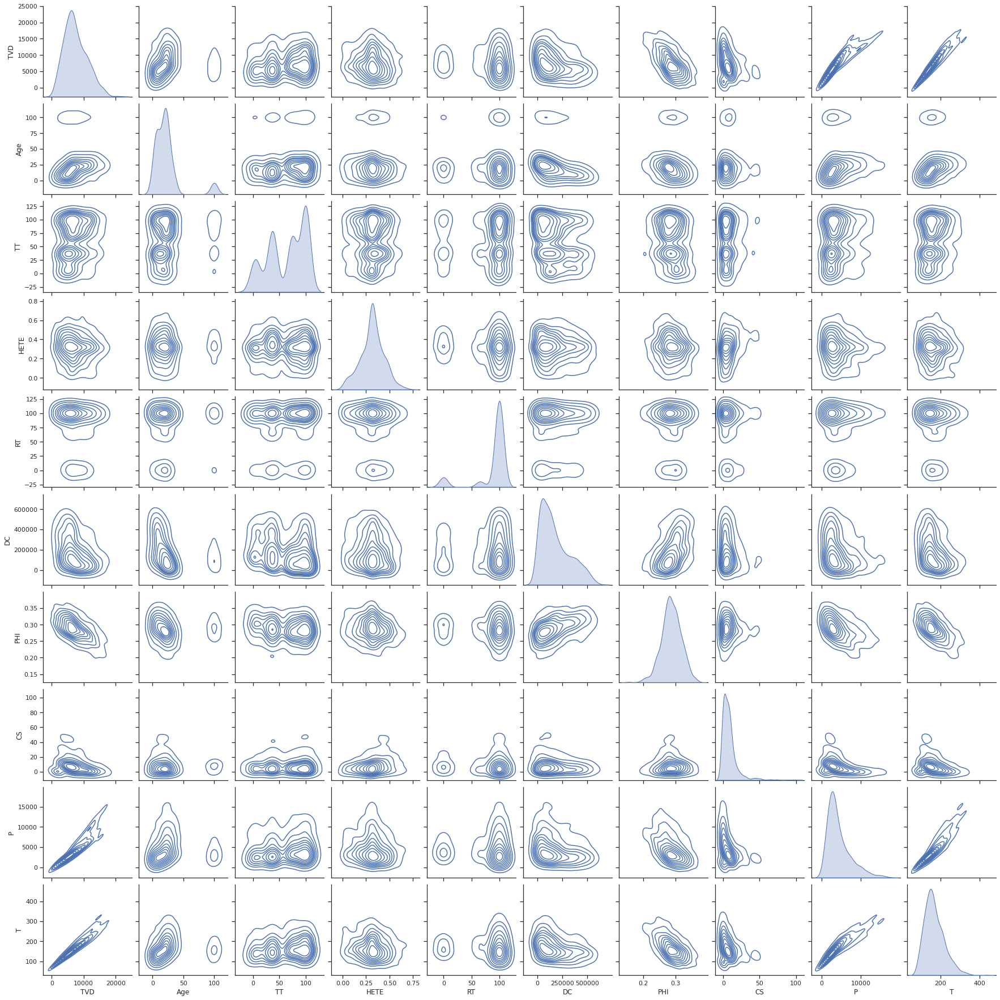

In [18]:
df_for_DT=pd.read_excel('tempresult2.xlsx')
sns.set_theme(style="ticks")
sns.pairplot(df_for_DT,kind='kde')

In [ ]:
# LOAD BOEM database
df = pd.read_excel('2018_BOEM.xlsx')
df.head(5)


,SN_FORMSAND,SAND_NAME,ASSESSED,SDDATE,SDYEAR,SDDATEH,SDYEARH,WELLAPI,BOEM_FIELD,FCLASS,...,GRECO,GRECG,GRP,NCNT,UCNT,SCNT,TCNT,BHCOMP,LAT,LONG
0,2,1761_BA001A_6500_1M,Y,1970-09-02,1970,1970-09-02,1970,427043003600,BA001A,PDN,...,347911,21585148,62.042,1,0,0,1,3,28.344173,-95.304180
1,3,1761_BA001A_6500_2M,Y,1970-09-02,1970,1970-09-02,1970,427043003600,BA001A,PDN,...,6605,500530,75.780,1,0,0,1,1,28.344173,-95.304180
2,4,1761_BA001A_6500_3M,Y,1970-09-02,1970,1970-09-02,1970,427043003600,BA001A,PDN,...,52501,2985295,56.862,1,0,0,1,1,28.344173,-95.304180
3,5,1761_BA001A_6500_5M,Y,1973-04-04,1973,1973-04-04,1973,427044000900,BA001A,PDN,...,56451,2842043,50.345,1,0,0,1,1,28.348074,-95.300825
4,6,1761_BA001A_6500_6M,Y,1970-09-02,1970,1970-09-02,1970,427043003600,BA001A,PDN,...,57159,3741506,65.458,1,0,0,1,1,28.344173,-95.304180


# Part 1: Data Exploration 

### Part 1.1: Understand the Raw Dataset

In [ ]:
ISG_df = df

In [ ]:
ISG_df.head()

,SN_FORMSAND,SAND_NAME,ASSESSED,SDDATE,SDYEAR,SDDATEH,SDYEARH,WELLAPI,BOEM_FIELD,FCLASS,...,GRECO,GRECG,GRP,NCNT,UCNT,SCNT,TCNT,BHCOMP,LAT,LONG
0,2,1761_BA001A_6500_1M,Y,1970-09-02,1970,1970-09-02,1970,427043003600,BA001A,PDN,...,347911,21585148,62.042,1,0,0,1,3,28.344173,-95.304180
1,3,1761_BA001A_6500_2M,Y,1970-09-02,1970,1970-09-02,1970,427043003600,BA001A,PDN,...,6605,500530,75.780,1,0,0,1,1,28.344173,-95.304180
2,4,1761_BA001A_6500_3M,Y,1970-09-02,1970,1970-09-02,1970,427043003600,BA001A,PDN,...,52501,2985295,56.862,1,0,0,1,1,28.344173,-95.304180
3,5,1761_BA001A_6500_5M,Y,1973-04-04,1973,1973-04-04,1973,427044000900,BA001A,PDN,...,56451,2842043,50.345,1,0,0,1,1,28.348074,-95.300825
4,6,1761_BA001A_6500_6M,Y,1970-09-02,1970,1970-09-02,1970,427043003600,BA001A,PDN,...,57159,3741506,65.458,1,0,0,1,1,28.344173,-95.304180


In [ ]:
# check data info
ISG_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13380 entries, 0 to 13379
Data columns (total 81 columns):
 #   Column           Non-Null Count  Dtype         
---  ------           --------------  -----         
 0   SN_FORMSAND      13380 non-null  int64         
 1   SAND_NAME        13380 non-null  object        
 2   ASSESSED         13380 non-null  object        
 3   SDDATE           13380 non-null  datetime64[ns]
 4   SDYEAR           13380 non-null  int64         
 5   SDDATEH          13380 non-null  datetime64[ns]
 6   SDYEARH          13380 non-null  int64         
 7   WELLAPI          13380 non-null  int64         
 8   BOEM_FIELD       13380 non-null  object        
 9   FCLASS           13380 non-null  object        
 10  FSTAT            13380 non-null  object        
 11  FSTRUC           13378 non-null  object        
 12  FTRAP1           12746 non-null  object        
 13  FTRAP2           4424 non-null   object        
 14  FDDATE           13380 non-null  datet

In [ ]:
#We don't need playcode, fieldcode, discovery year, lease
ISG_df.drop(['SN_FORMSAND','SAND_NAME','ASSESSED','SDDATE','SDYEAR','SDDATEH','SDYEARH','WELLAPI','FCLASS',
             'FSTAT','FTRAP2','FDDATE','FDYEAR','EIAID','PLAREA','PLAY_NUM','PLAY_NAME','POOL_NAME','PLAY_TYPE',
             'OAREA','OVOL','GAREA','GVOL','RESTYP','PROP','RECO_AF','RECG_AF','ORECO','ORECG','ORP','GRF','GRECO','GRECG','GRP','NCNT','UCNT','SCNT','TCNT','BHCOMP'],inplace=True,axis=1)


In [ ]:
# check data info
ISG_df.describe()

,WDEP,Recoverable Oil,Recoverable Gas,Recoverable BOE,Cum Oil,Cum Gas,Cum BOE,Oil Reserves,Gas Reserves,BOE Reserves,...,GOR,SPGR,API,BGI,BOI,OIP,GIP,ORF,LAT,LONG
count,13380.000000,1.338000e+04,1.338000e+04,1.338000e+04,1.338000e+04,1.338000e+04,1.338000e+04,1.338000e+04,1.338000e+04,1.338000e+04,...,1.338000e+04,13380.000000,13380.000000,13380.000000,13380.000000,1.338000e+04,1.338000e+04,13380.000000,13380.000000,13380.000000
mean,362.040359,1.842541e+06,1.458902e+07,4.438453e+06,1.553217e+06,1.411487e+07,4.064759e+06,2.893234e+05,4.741595e+05,3.736934e+05,...,2.731687e+04,0.512152,11.566069,206.802616,0.522916,5.474893e+06,2.483908e+07,0.106213,28.678874,-91.852135
std,971.762402,1.073994e+07,4.339575e+07,1.493642e+07,8.344707e+06,4.254126e+07,1.269763e+07,3.891696e+06,4.084023e+06,4.406895e+06,...,9.420549e+05,0.221574,16.089114,115.311497,0.735346,3.742711e+07,7.097697e+07,0.177445,0.561904,2.029349
min,9.000000,0.000000e+00,0.000000e+00,1.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000e+00,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,26.024625,-97.118262
25%,57.000000,2.180500e+03,7.391080e+05,2.085390e+05,1.548000e+03,6.285598e+05,1.744425e+05,0.000000e+00,0.000000e+00,0.000000e+00,...,2.269456e+00,0.580000,0.000000,141.000000,0.000000,0.000000e+00,9.264035e+05,0.000000,28.299938,-93.172125
50%,124.000000,4.770350e+04,3.206128e+06,8.910525e+05,4.030500e+04,2.993727e+06,8.172435e+05,0.000000e+00,0.000000e+00,0.000000e+00,...,4.311689e+01,0.600000,0.000000,228.000000,0.000000,0.000000e+00,5.807808e+06,0.000000,28.727994,-91.767769
75%,217.000000,5.664752e+05,1.148017e+07,3.302392e+06,4.962892e+05,1.106237e+07,3.116024e+06,0.000000e+00,0.000000e+00,0.000000e+00,...,3.270032e+02,0.610000,31.000000,292.000000,1.347000,1.099917e+06,2.066704e+07,0.190000,29.082903,-90.375736
max,9404.000000,6.761858e+08,1.171703e+09,8.444507e+08,5.301117e+08,1.171049e+09,6.581338e+08,2.223239e+08,2.261645e+08,2.415226e+08,...,7.732468e+07,0.990000,60.000000,546.000000,3.324000,1.613372e+09,1.854120e+09,2.320000,30.189509,-87.662640


### Explore Categorical Data



In [ ]:
#drop non and reset index
ISG_df_hasdata = ISG_df.dropna(how='any')
ISG_df_hasdata.reset_index(drop=True,inplace=True)



In [ ]:
#add geo age # OTHER contains OU:upper Oligocene, KUL: Upper lower cretaceous, KLL: Lower lower cretaceous, JU-JM: Jurassic
ISG_df_hasdata['GEO_AGE'] = 'OTHER'
ISG_df_hasdata['GEO_AGE_Detail'] = 'OTHER'
ISG_df_hasdata.GEO_AGE.loc[ISG_df_hasdata.CHRONOZONE.str.contains('MU')]='Miocene'
ISG_df_hasdata.GEO_AGE.loc[ISG_df_hasdata.CHRONOZONE.str.contains('MM')]='Miocene'
ISG_df_hasdata.GEO_AGE.loc[ISG_df_hasdata.CHRONOZONE.str.contains('ML')]='Miocene'
ISG_df_hasdata.GEO_AGE_Detail.loc[ISG_df_hasdata.CHRONOZONE.str.contains('MU')]='Upper Miocene'
ISG_df_hasdata.GEO_AGE_Detail.loc[ISG_df_hasdata.CHRONOZONE.str.contains('MM')]='Middle Miocene'
ISG_df_hasdata.GEO_AGE_Detail.loc[ISG_df_hasdata.CHRONOZONE.str.contains('ML')]='Lower Miocene'
ISG_df_hasdata.GEO_AGE.loc[ISG_df_hasdata.CHRONOZONE.str.contains('PLU')]='Pleistocene'
ISG_df_hasdata.GEO_AGE.loc[ISG_df_hasdata.CHRONOZONE.str.contains('PLM')]='Pleistocene'
ISG_df_hasdata.GEO_AGE.loc[ISG_df_hasdata.CHRONOZONE.str.contains('PLL')]='Pleistocene'
ISG_df_hasdata.GEO_AGE_Detail.loc[ISG_df_hasdata.CHRONOZONE.str.contains('PLU')]='Upper Pleistocene'
ISG_df_hasdata.GEO_AGE_Detail.loc[ISG_df_hasdata.CHRONOZONE.str.contains('PLM')]='Middle Pleistocene'
ISG_df_hasdata.GEO_AGE_Detail.loc[ISG_df_hasdata.CHRONOZONE.str.contains('PLL')]='Lower Pleistocene'
ISG_df_hasdata.GEO_AGE.loc[ISG_df_hasdata.CHRONOZONE==('PU')]='Pliocene'
ISG_df_hasdata.GEO_AGE.loc[ISG_df_hasdata.CHRONOZONE==('PL')]='Pliocene'
ISG_df_hasdata.GEO_AGE.loc[ISG_df_hasdata.CHRONOZONE==('PU-PL')]='Pliocene'
ISG_df_hasdata.GEO_AGE_Detail.loc[ISG_df_hasdata.CHRONOZONE==('PU')]='Upper Pliocene'
ISG_df_hasdata.GEO_AGE_Detail.loc[ISG_df_hasdata.CHRONOZONE==('PL')]='Lower Pliocene'
ISG_df_hasdata.GEO_AGE_Detail.loc[ISG_df_hasdata.CHRONOZONE==('PU-PL')]='Middle Pliocene'

#convert full name to letter labels
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==('Anticline')]='A'
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==('Fault')]='B'
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==("Shallow Salt Diapir: 0 - 4,000'SS")]='C'
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==("Intermediate Salt Diapir: 4,000 - 10,000'SS")]='D'
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==("Deep Salt Dome: > 10,000'SS")]='E'
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==('Salt Ridge')]='F'
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==('Shale Diapir')]='G'
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==('Unconformity')]='H'
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==('Stratigraphic')]='I'
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==('Rollover into growth fault')]='K'

#Other contains <100 numbers
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==('Nonpiercement Louann Salt')]='OTHER'
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==('Thrust Fault')]='OTHER'
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==('Rotational Slump Block')]='OTHER'
ISG_df_hasdata.FSTRUC.loc[ISG_df_hasdata.FSTRUC==('Reef')]='OTHER'
#Other contains ~<10 numbers
ISG_df_hasdata.FTRAP1.loc[ISG_df_hasdata.FTRAP1==('O')]='OTHER'
ISG_df_hasdata.FTRAP1.loc[ISG_df_hasdata.FTRAP1==('P')]='OTHER'
ISG_df_hasdata.FTRAP1.loc[ISG_df_hasdata.FTRAP1==('M')]='OTHER'
ISG_df_hasdata.FTRAP1.loc[ISG_df_hasdata.FTRAP1==('U')]='OTHER'

#Reorder the entries based on geo age
ISG_df_1 = ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE_Detail == 'Upper Pleistocene']
ISG_df_2 = ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE_Detail == 'Middle Pleistocene']
ISG_df_3 = ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE_Detail == 'Lower Pleistocene']
ISG_df_4 = ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE_Detail == 'Upper Pliocene']
ISG_df_5 = ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE_Detail == 'Middle Pliocene']
ISG_df_6 = ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE_Detail == 'Lower Pliocene']
ISG_df_7 = ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE_Detail == 'Upper Miocene']
ISG_df_8 = ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE_Detail == 'Middle Miocene']
ISG_df_9 = ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE_Detail == 'Lower Miocene']
ISG_df_10 = ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE_Detail == 'OTHER']
ISG_df_hasdata = pd.concat([ISG_df_1,ISG_df_2,ISG_df_3,ISG_df_4,ISG_df_5,ISG_df_6,ISG_df_7,ISG_df_8,ISG_df_9,ISG_df_10])
ISG_df_hasdata.reset_index(drop=True,inplace=True)

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  
/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  This is separate from the ipykernel package so we can avoid doing imports until
/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pand

In [ ]:
ISG_df_hasdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12337 entries, 0 to 12336
Data columns (total 44 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   BOEM_FIELD       12337 non-null  object 
 1   FSTRUC           12337 non-null  object 
 2   FTRAP1           12337 non-null  object 
 3   SAND             12337 non-null  object 
 4   CHRONOZONE       12337 non-null  object 
 5   SD_TYPE          12337 non-null  object 
 6   WDEP             12337 non-null  int64  
 7   Recoverable Oil  12337 non-null  int64  
 8   Recoverable Gas  12337 non-null  int64  
 9   Recoverable BOE  12337 non-null  int64  
 10  Cum Oil          12337 non-null  int64  
 11  Cum Gas          12337 non-null  int64  
 12  Cum BOE          12337 non-null  int64  
 13  Oil Reserves     12337 non-null  int64  
 14  Gas Reserves     12337 non-null  int64  
 15  BOE Reserves     12337 non-null  int64  
 16  SS               12337 non-null  int64  
 17  THK         

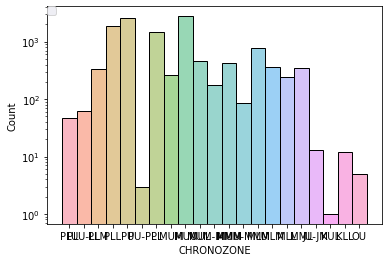

In [ ]:
g=sns.histplot(x='CHRONOZONE',hue='CHRONOZONE',data=ISG_df_hasdata)
sns.set(rc={'figure.figsize':(20,5)})
g.set(yscale='log')
plt.legend( loc='upper left', borderaxespad=0)

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0, flags=flags)


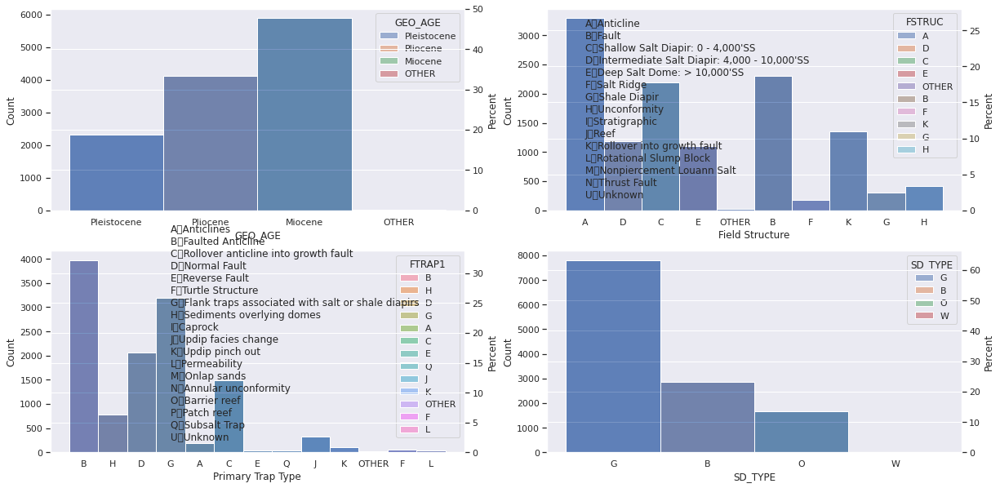

In [ ]:
_,axss = plt.subplots(2,2, figsize=[20,10])

g0=sns.histplot(x='GEO_AGE',hue='GEO_AGE',data=ISG_df_hasdata,ax=axss[0][0])

g00=sns.histplot(x='GEO_AGE',data=ISG_df_hasdata,ax=axss[0][0].twinx(),stat='percent')
g0.grid(False)
g1=sns.histplot(x='FSTRUC',hue='FSTRUC',data=ISG_df_hasdata,ax=axss[0][1])
g11=sns.histplot(x='FSTRUC',data=ISG_df_hasdata,ax=axss[0][1].twinx(),stat='percent')
g1.grid(False)
plt.text('A',0,'''
A	Anticline
B	Fault
C	Shallow Salt Diapir: 0 - 4,000'SS
D	Intermediate Salt Diapir: 4,000 - 10,000'SS
E	Deep Salt Dome: > 10,000'SS
F	Salt Ridge
G	Shale Diapir
H	Unconformity
I	Stratigraphic
J	Reef
K	Rollover into growth fault
L	Rotational Slump Block
M	Nonpiercement Louann Salt
N	Thrust Fault
U	Unknown
''')
g1.set(xlabel='Field Structure')
g2=sns.histplot(x='FTRAP1',hue='FTRAP1',data=ISG_df_hasdata,ax=axss[1][0])

g22=sns.histplot(x='FTRAP1',data=ISG_df_hasdata,ax=axss[1][0].twinx(),stat='percent')
plt.text('G',0,'''
A	Anticlines
B	Faulted Anticline
C	Rollover anticline into growth fault
D	Normal Fault
E	Reverse Fault
F	Turtle Structure
G	Flank traps associated with salt or shale diapirs
H	Sediments overlying domes
I	Caprock
J	Updip facies change
K	Updip pinch out
L	Permeability
M	Onlap sands
N	Annular unconformity
O	Barrier reef
P	Patch reef
Q	Subsalt Trap
U	Unknown
''')
g2.set(xlabel='Primary Trap Type')
g2.grid(False)
g3=sns.histplot(x='SD_TYPE',hue='SD_TYPE',data=ISG_df_hasdata,ax=axss[1][1])
g33=sns.histplot(x='SD_TYPE',data=ISG_df_hasdata,ax=axss[1][1].twinx(),stat='percent')
g3.grid(False)
plt.show()

# Data wrangling and check relationship behind the dataset

## Label data via added column
### Volume unit MMSCF
### Here we used the method from DOE-NETL, 2015 "https://www.netl.doe.gov/research/coal/carbonstorage/atlasv" to calculate depleted volumes of gas/oil that can be used for CO2 storage
### Vol_CO2 = A*h*phi*(1-Sw)*B*rho_CO2*E_og, where E_og is fx of recovery factor given by Agartan et al. 2018 "https://www.sciencedirect.com/science/article/pii/S1750583617308666?via%3Dihub"
### Formation factor B is calculated by Hassanzadeh et al. 2008 "https://www.sciencedirect.com/science/article/pii/S1750583607000102"

In [ ]:

ISG_df_hasdata.rename(columns={'Pi':'PI'},inplace=True)
B = 18256*ISG_df_hasdata['TI']**(-0.738)*ISG_df_hasdata['PI']**(0.0713*np.log((ISG_df_hasdata['TI']-130)/300)-0.9968)

#Correlate Capacity with equation
HCRF = (ISG_df_hasdata['Recoverable Gas']+ISG_df_hasdata['Recoverable Oil']*5.615)/(ISG_df_hasdata['GIP']+ISG_df_hasdata['OIP']*5.615)
# volume unit MM SCF
ISG_df_hasdata['Max_Vol'] = ISG_df_hasdata['THK']*ISG_df_hasdata['TAREA']*43560.17*ISG_df_hasdata['POROSITY']*(1-ISG_df_hasdata['SW'])*HCRF/1000000
#ISG_df_hasdata['Max_Vol'] = ISG_df_hasdata['THK']*ISG_df_hasdata['TAREA']*43560.17*ISG_df_hasdata['POROSITY']*(1-ISG_df_hasdata['SW'])*1/B/10**6

/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/usr/local/lib/python3.7/dist-packages/pandas/core/arraylike.py:364: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


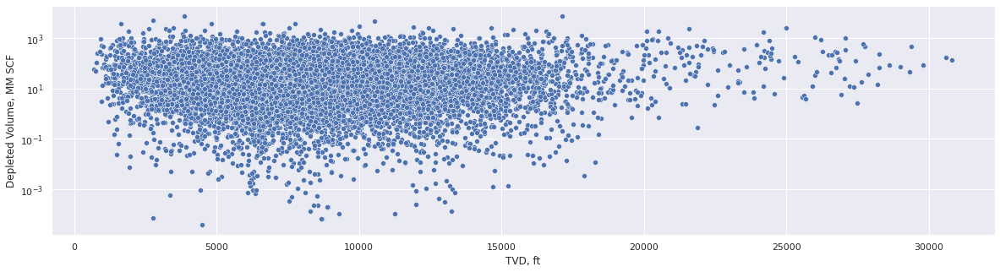

In [ ]:
g=sns.scatterplot(x='SS',y='Max_Vol',data=ISG_df_hasdata)
g.set(ylabel='Depleted Volume, MM SCF',xlabel='TVD, ft')
g.set_yscale('log')

[Text(0.5, 0, 'Field Structure')]

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0, flags=flags)


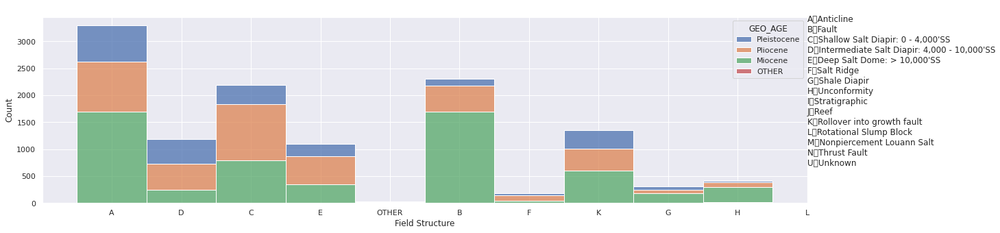

In [ ]:
# Next we check the trap type distributions

ax=sns.histplot(x='FSTRUC',data=ISG_df_hasdata,stat='count',hue='GEO_AGE',element='bars',multiple='stack',legend=True)

plt.text('L',500,'''
A	Anticline
B	Fault
C	Shallow Salt Diapir: 0 - 4,000'SS
D	Intermediate Salt Diapir: 4,000 - 10,000'SS
E	Deep Salt Dome: > 10,000'SS
F	Salt Ridge
G	Shale Diapir
H	Unconformity
I	Stratigraphic
J	Reef
K	Rollover into growth fault
L	Rotational Slump Block
M	Nonpiercement Louann Salt
N	Thrust Fault
U	Unknown
''')
ax.set(xlabel='Field Structure')

[Text(0.5, 0, 'Primary Trap Type')]

/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0, flags=flags)


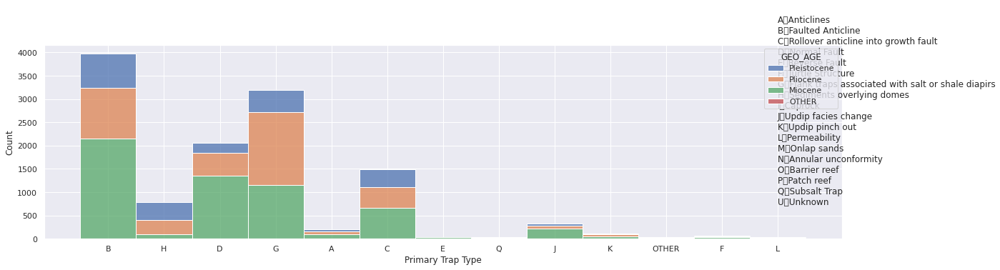

In [ ]:

ax=sns.histplot(x='FTRAP1',data=ISG_df_hasdata,stat='count',hue='GEO_AGE',element='bars',multiple='stack',legend=True)

plt.text('L',500,'''
A	Anticlines
B	Faulted Anticline
C	Rollover anticline into growth fault
D	Normal Fault
E	Reverse Fault
F	Turtle Structure
G	Flank traps associated with salt or shale diapirs
H	Sediments overlying domes
I	Caprock
J	Updip facies change
K	Updip pinch out
L	Permeability
M	Onlap sands
N	Annular unconformity
O	Barrier reef
P	Patch reef
Q	Subsalt Trap
U	Unknown
''')
ax.set(xlabel='Primary Trap Type')


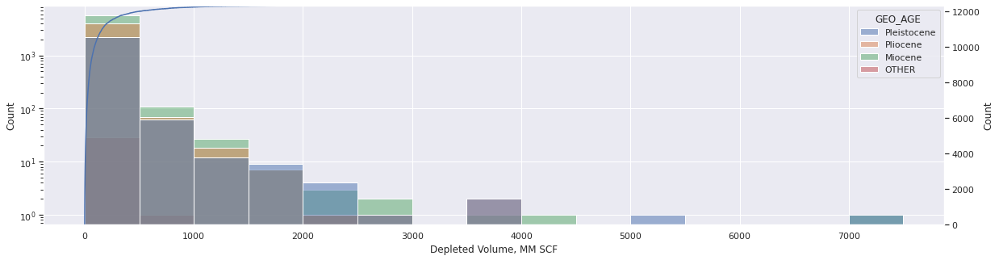

In [ ]:
_,ax1 = plt.subplots()
g=sns.histplot(x='Max_Vol',hue='GEO_AGE',data=ISG_df_hasdata,stat='count',binwidth=500,ax=ax1)
axss=ax1.twinx()
g1=sns.ecdfplot(x='Max_Vol',data=ISG_df_hasdata,stat='count',ax=axss)
g1.grid(False)
g.set_xlabel('Depleted Volume, MM SCF')
g.set_yscale('log')

plt.show()

### Overburden pressure gredient based on https://www.sciencedirect.com/topics/engineering/fracture-gradient fig. 3.5

In [ ]:
# Reduce shallow depth and overburden reservoirs
PG=0.6049*ISG_df_hasdata.SS**0.0493
ISG_df_hasdata['CAND']='Candidate'
ISG_df_Candidate=ISG_df_hasdata.loc[ISG_df_hasdata.PI/ISG_df_hasdata.SS<PG]
ISG_df_OB=ISG_df_hasdata.loc[ISG_df_hasdata.PI/ISG_df_hasdata.SS>=PG]
ISG_df_hasdata['CAND'].loc[ISG_df_hasdata.PI/ISG_df_hasdata.SS>=PG] = 'OB'
ISG_df_hasdata['CAND'].loc[(ISG_df_hasdata.PI/ISG_df_hasdata.SS>=PG) & (ISG_df_hasdata.PI<=1070)] = 'OB and Not SC'
ISG_df_hasdata['CAND'].loc[(ISG_df_hasdata.PI/ISG_df_hasdata.SS>=PG) & (ISG_df_hasdata.TI<=87.8)] = 'OB and Not SC'
ISG_df_hasdata['CAND'].loc[(ISG_df_hasdata.PI/ISG_df_hasdata.SS<PG) & (ISG_df_hasdata.PI<=1070)] = 'Not SC'
ISG_df_hasdata['CAND'].loc[(ISG_df_hasdata.PI/ISG_df_hasdata.SS<PG) & (ISG_df_hasdata.TI<=87.8)] = 'Not SC'

ISG_df_Shallow1=ISG_df_hasdata.loc[ISG_df_hasdata.PI<=1070]
ISG_df_Shallow2=ISG_df_hasdata.loc[ISG_df_hasdata.TI<=87.8]

ISG_df_Candidate=ISG_df_Candidate.loc[ISG_df_Candidate.PI>1070]
ISG_df_Candidate=ISG_df_Candidate.loc[ISG_df_Candidate.TI>87.8]


ISG_df_Shallow=pd.concat([ISG_df_Shallow1,ISG_df_Shallow2], ignore_index=True)
ISG_df_Shallow.drop_duplicates(inplace=True)


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


### Overburden pressure based on constant value 0.465, fracture 0.926 psi/ft, fig. 10 in https://pubs.usgs.gov/sir/2011/5083/sir2011-5083.pdf

In [ ]:
# Label underpressure, overpressure, fracking pressure
PG1=0.5
PG2=0.926
ISG_df_hasdata['DP_REGION']='Underpressure'
ISG_df_underpressure=ISG_df_hasdata.loc[ISG_df_hasdata.PI/ISG_df_hasdata.SS<PG1]
ISG_df_overpressure=ISG_df_hasdata.loc[(ISG_df_hasdata.PI/ISG_df_hasdata.SS>=PG1) & (ISG_df_hasdata.PI/ISG_df_hasdata.SS<PG2)]
ISG_df_fracpressure=ISG_df_hasdata.loc[ISG_df_hasdata.PI/ISG_df_hasdata.SS>PG2]

ISG_df_hasdata['DP_REGION'].loc[(ISG_df_hasdata.PI/ISG_df_hasdata.SS>=PG1) & (ISG_df_hasdata.PI/ISG_df_hasdata.SS<PG2)] = 'Overpressure'
ISG_df_hasdata['DP_REGION'].loc[(ISG_df_hasdata.PI/ISG_df_hasdata.SS>=PG2)] = 'Frac pressure'
ISG_df_hasdata['DP_REGION'].loc[(ISG_df_hasdata.PI<=1070)] = 'Not SC'
ISG_df_hasdata['DP_REGION'].loc[(ISG_df_hasdata.TI<=87.8)] = 'Not SC'


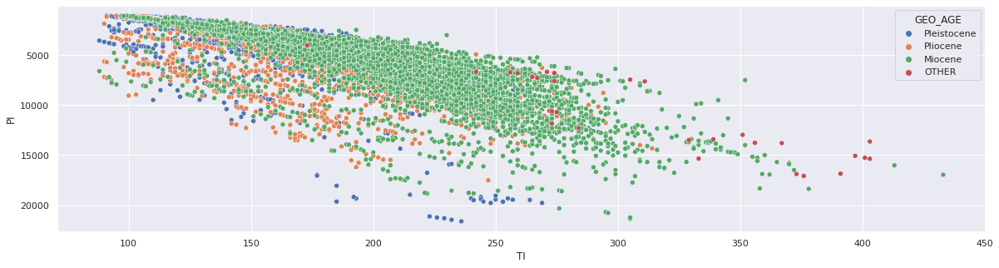

In [ ]:
ax1=sns.scatterplot(x='TI',y='PI',data=ISG_df_Candidate, hue='GEO_AGE')
ax1.invert_yaxis()

## This result of candidates based on fracture line

[Text(0.5, 0, 'Pressure, psi')]

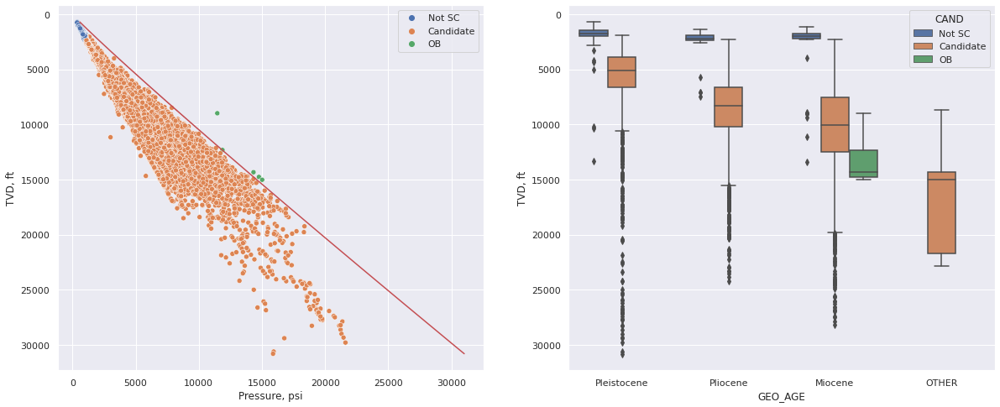

In [ ]:
# create a figure
fig = plt.figure()
# to change size of subplot's
# set height of each subplot as 8
fig.set_figheight(8)
# set width of each subplot as 8
fig.set_figwidth(20)
# create grid for different subplots
spec = gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[1, 1], wspace=0.2,
                         )
ax0 = fig.add_subplot(spec[0])

ax1=sns.scatterplot(x='PI',y='SS',data=ISG_df_hasdata, hue='CAND',ax=ax0)
ax1.invert_yaxis()
sns.lineplot(x=ISG_df_hasdata.SS*0.6049*ISG_df_hasdata.SS**0.0493,y=ISG_df_hasdata.SS,ax=ax0,color='r')

ax2 = fig.add_subplot(spec[1])
ax3=sns.boxplot(x='GEO_AGE',y='SS',data=ISG_df_hasdata, hue='CAND',ax=ax2)
ax3.invert_yaxis()
ax1.set(ylabel='TVD, ft')
ax3.set(ylabel='TVD, ft')
ax1.set(xlabel='Pressure, psi')

## This candidates based on hydrostatic and lithostatic line

[Text(0.5, 0, 'Pressure, psi')]

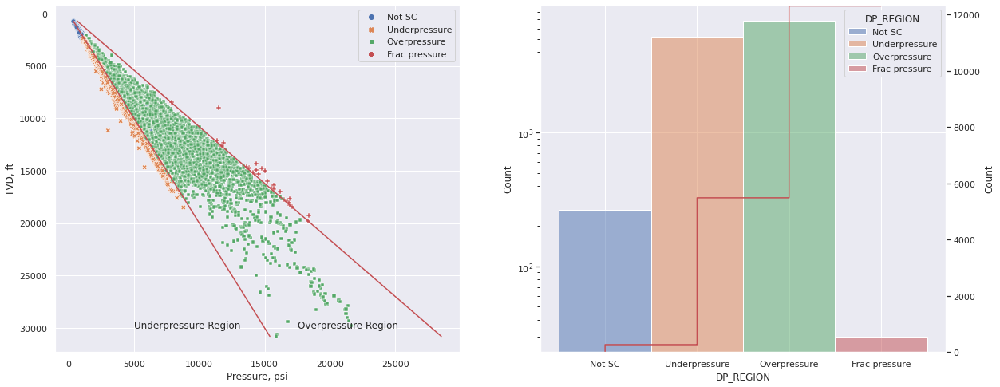

In [ ]:
# create a figure
fig = plt.figure()
# to change size of subplot's
# set height of each subplot as 8
fig.set_figheight(8)
# set width of each subplot as 8
fig.set_figwidth(20)
# create grid for different subplots
spec = gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[1, 1], wspace=0.2,
                         )
ax0 = fig.add_subplot(spec[0])

ax1=sns.scatterplot(x='PI',y='SS',data=ISG_df_hasdata, hue='DP_REGION',style ='DP_REGION' ,ax=ax0)
ax1.invert_yaxis()
sns.lineplot(x=ISG_df_hasdata.SS*0.5,y=ISG_df_hasdata.SS,ax=ax0,color='r')
sns.lineplot(x=ISG_df_hasdata.SS*0.926,y=ISG_df_hasdata.SS,ax=ax0,color='r')
plt.text(5000,30000,'Underpressure Region')
plt.text(17500,30000,'Overpressure Region')

ax2 = fig.add_subplot(spec[1])
ax3=sns.histplot(x='DP_REGION',data=ISG_df_hasdata, hue='DP_REGION',ax=ax2)
ax3.set_yscale('log')
ax4 = ax2.twinx()
ax5 = sns.ecdfplot(x='DP_REGION',data=ISG_df_hasdata, color='r',stat = 'count', ax=ax4)
ax5.grid(False)
for container in ax5.containers:
    ax5.bar_label(container)

ax1.set(ylabel='TVD, ft')
ax1.set(xlabel='Pressure, psi')

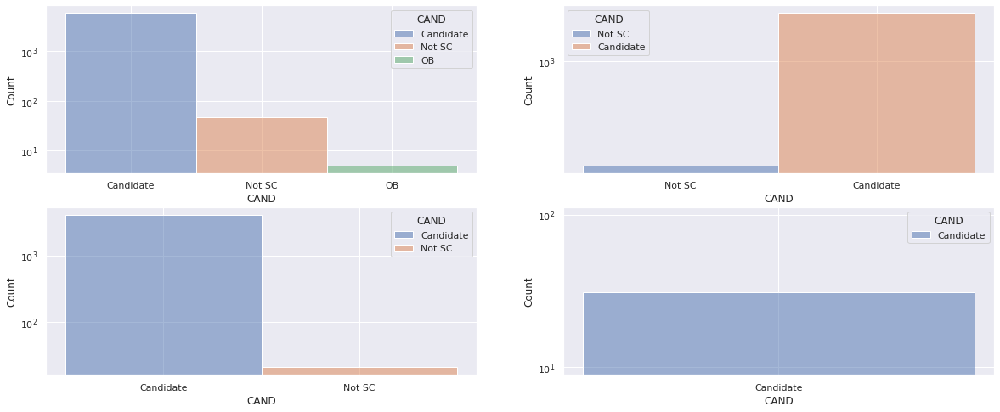

In [ ]:
# create a figure
fig = plt.figure()
# to change size of subplot's
# set height of each subplot as 8
fig.set_figheight(8)
# set width of each subplot as 8
fig.set_figwidth(20)
# create grid for different subplots
spec = gridspec.GridSpec(ncols=2, nrows=2,
                         width_ratios=[1, 1], wspace=0.2,
                         )
ax0 = fig.add_subplot(spec[0])
sns.histplot(x='CAND',data=ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE=='Miocene'], hue='CAND',discrete=True,ax=ax0)
ax1 = fig.add_subplot(spec[1])
sns.histplot(x='CAND',data=ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE=='Pleistocene'], hue='CAND',discrete=True,ax=ax1)
ax2 = fig.add_subplot(spec[2])
sns.histplot(x='CAND',data=ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE=='Pliocene'], hue='CAND',discrete=True,ax=ax2)
ax3 = fig.add_subplot(spec[3])
sns.histplot(x='CAND',data=ISG_df_hasdata.loc[ISG_df_hasdata.GEO_AGE=='OTHER'], hue='CAND',discrete=True,ax=ax3)
ax0.set_yscale('log')

ax1.set_yscale('log')

ax2.set_yscale('log')

ax3.set_yscale('log')


## Due to varied geological structures, the PVT table of CO2 may not always based on depth alone.
## By drawing a scatter plot of PI vs TI and label the data by geo age, we may see where we can inject CO2 in supercritical region

### Payzone thickness and volume are important factors to assess storage capacity

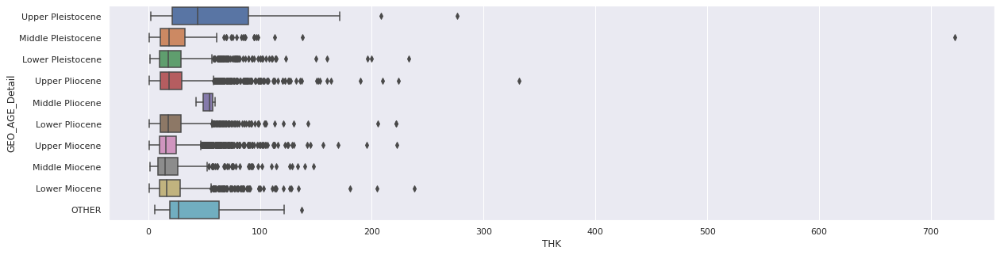

In [ ]:
#ranking the payzone thickness
sns.boxplot(x='THK',y='GEO_AGE_Detail',data=ISG_df_hasdata)
sns.set(rc={'figure.figsize':(8,8)})

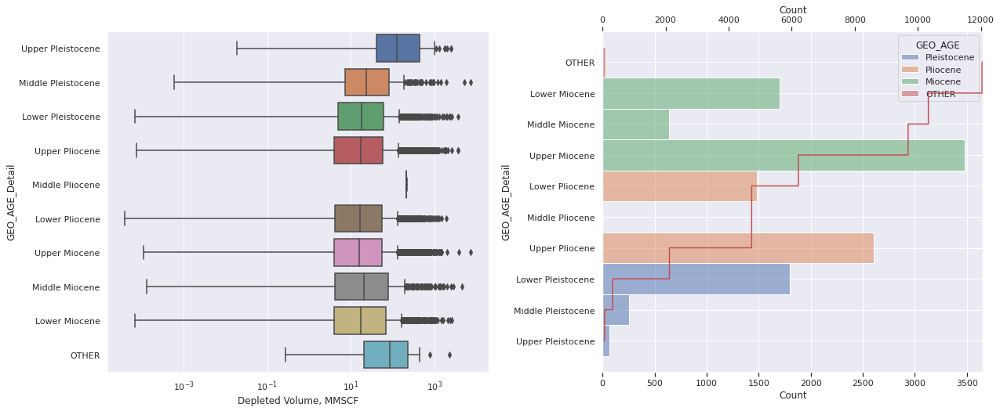

In [ ]:
#Ranking the Volume
# create a figure
fig = plt.figure()
# to change size of subplot's
# set height of each subplot as 8
fig.set_figheight(8)
# set width of each subplot as 8
fig.set_figwidth(20)
# create grid for different subplots
spec = gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[1, 1], wspace=0.3,
                         )
ax0 = fig.add_subplot(spec[0])
g=sns.boxplot(x='Max_Vol',y='GEO_AGE_Detail',data=ISG_df_Candidate,ax=ax0)
plt.xlabel('Depleted Volume, MMSCF')
g.set_xscale('log')

ax1 = fig.add_subplot(spec[1])
sns.histplot(y='GEO_AGE_Detail',data=ISG_df_Candidate,hue='GEO_AGE',ax=ax1)

ax2 = ax1.twiny()
sns.ecdfplot(y='GEO_AGE_Detail',data=ISG_df_Candidate,stat='count',color='r',ax=ax2)
ax2.grid(False)
ax2.invert_yaxis()

### Assume CO2 density constant at depth > 5500 based on 
https://www.researchgate.net/figure/Graphic-depiction-of-CO-2-density-changes-with-depth-Figure-taken-from-CO-2-CRC-2008_fig3_259487433
and "Significance of carbon dioxide density estimates for basin-scale storage resource assessments" https://www.google.com/url?sa=t&rct=j&q=&esrc=s&source=web&cd=&cad=rja&uact=8&ved=2ahUKEwi4ioL57Oz6AhW8m2oFHSyIBDgQFnoECBQQAw&url=https%3A%2F%2Fwww.sciencedirect.com%2Fscience%2Farticle%2Fpii%2FS1876610214023583%2Fpdf%3Fmd5%3Dca858b5860c8fdcbdcec47dc9bb418e0%26pid%3D1-s2.0-S1876610214023583-main.pdf&usg=AOvVaw3UfiKlu0BwHOdqVlKqv8ou


/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


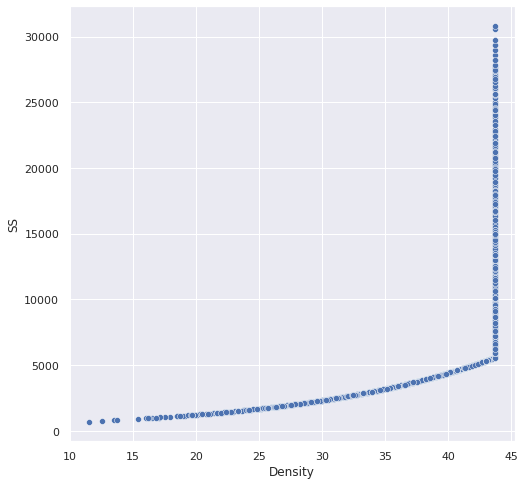

In [ ]:
#Add column density
ISG_df_hasdata['Density'] = 43.7
ISG_df_hasdata.Density.loc[ISG_df_hasdata.SS < 5500] = 15.5*np.log(ISG_df_hasdata.SS)-90
sns.scatterplot(y=ISG_df_hasdata.SS,x=ISG_df_hasdata.Density)

## This is an empirical calculation of CO2 density from Wang, zhiyuan : "Improved Density Correlation forSupercritical CO2"
def capacity(vol,T,P,BGI):
    cap=np.zeros((len(T),1))
    a=[[0.105,-0.269,0.171,0],[-2.629,7.556,-6.38,1.324],[26.099,-81.318,79.364,23.26],[-128.855,425.084,-451.933,152.811],[322.905,-1109.777,1246.29,-455.090],[-365.706,1294.024,-1507.252,576.925],[126.659,-454.597,538.577,-210.395]]
    Tc=304
    Pc=7.38
    for i in range(len(T)):
        
        #convert unit F to K, psi to MPa and convert to relative value
        T_temp=((T[i]-32)*5/9+273.15)/Tc 
        P_temp=(P[i]/145)/Pc
        #calculate
        x2=[[T_temp**3],[T_temp**2],[T_temp**1],[T_temp**0]]
        x1=[P_temp**6,P_temp**5,P_temp**4,P_temp**3,P_temp**2,P_temp**1,P_temp**0]
        rho_temp=np.dot(x1,np.dot(a,x2)) #kg/m3
        rho = rho_temp
        
        vol_temp = vol[i]*BGI[i]/35.315 # MMRCF to MMSCF to MM m3
        cap[i] = vol_temp*rho/1000 # MM kg to MM ton
        
    return cap
ISG_df_hasdata['Capacity'] = ISG_df_hasdata['TI']*0
# Check the CO2 capacity
# To calculate CO2 capacity, we need to consider the CO2 density at supercitical region. Density Equation from Wang Zhiyuan rho=(ai_m*T^n)P^m, i = 0,1,2,3, n = 0,1,2,3, m=0,1,2,3,4,5,6
ISG_df_hasdata['Capacity'] = capacity(ISG_df_hasdata.Max_Vol,ISG_df_hasdata.TI,ISG_df_hasdata.PI,ISG_df_hasdata.BGI)
ISG_df_hasdata.Capacity.describe()

In [ ]:
# Calculate capacity based on calculated density
ISG_df_hasdata['Capacity'] = ISG_df_hasdata.Density * ISG_df_hasdata.Max_Vol * 10**6 * 0.0005 # lb to ton
Capacity_by_field = ISG_df_hasdata.groupby('BOEM_FIELD')['Capacity'].agg('sum')
Capacity_by_field

BOEM_FIELD
AC024    2.113107e+06
AC025    2.053853e+07
AC065    3.324399e+06
AC857    6.950428e+07
AC859    8.866235e+06
             ...     
WR469    3.974715e+06
WR508    8.997294e+06
WR627    7.799789e+06
WR678    3.346494e+07
WR759    2.151570e+07
Name: Capacity, Length: 1223, dtype: float64

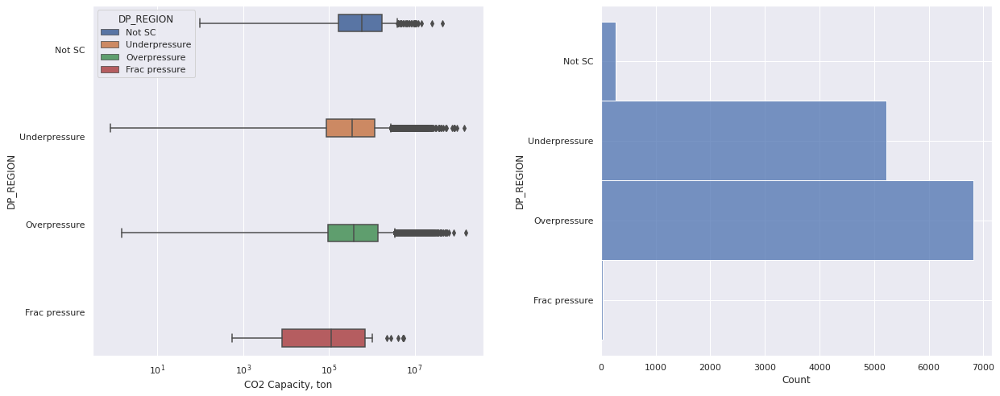

In [ ]:
#Ranking the Capacity
# create a figure
fig = plt.figure()
# to change size of subplot's
# set height of each subplot as 8
fig.set_figheight(8)
# set width of each subplot as 8
fig.set_figwidth(20)
# create grid for different subplots
spec = gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[1, 1], wspace=0.3,
                         )
ax0 = fig.add_subplot(spec[0])
g=sns.boxplot(x='Capacity',y='DP_REGION',data=ISG_df_hasdata,hue='DP_REGION',ax=ax0)
plt.xlabel('CO2 Capacity, ton')
g.set_xscale('log')
ax1 = fig.add_subplot(spec[1])
sns.histplot(y='DP_REGION',data=ISG_df_hasdata,ax=ax1)


Text(0.5, 1.0, 'Porosity')

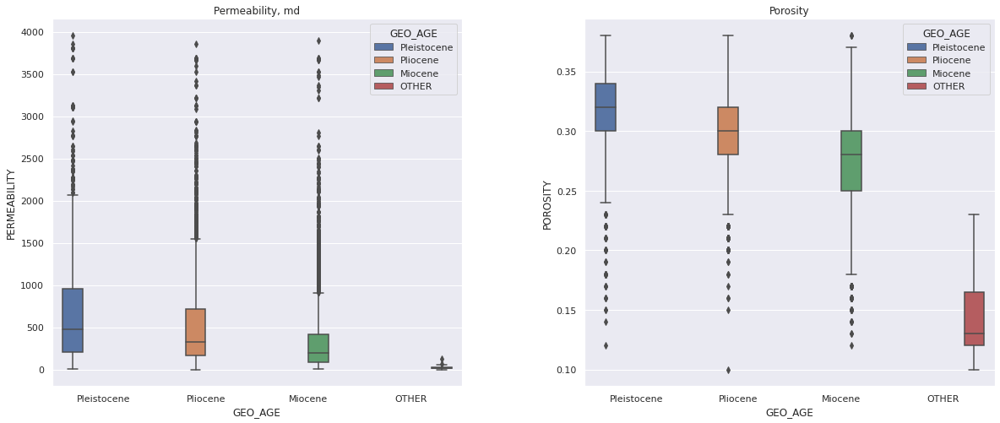

In [ ]:
# Investigation of permeability and porosity
# create a figure
fig = plt.figure()
# to change size of subplot's
# set height of each subplot as 8
fig.set_figheight(8)
# set width of each subplot as 8
fig.set_figwidth(20)
# create grid for different subplots
spec = gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[1, 1], wspace=0.3,
                         )
ax0 = fig.add_subplot(spec[0])
g=sns.boxplot(x='GEO_AGE',y='PERMEABILITY',data=ISG_df_hasdata,hue='GEO_AGE',ax=ax0)
plt.xlabel('GEO_AGE')
ax0.set_title('Permeability, md')

ax1 = fig.add_subplot(spec[1])
g1=sns.boxplot(x='GEO_AGE',y='POROSITY',data=ISG_df_hasdata,hue='GEO_AGE',ax=ax1)

ax1.set_title('Porosity')

## CO2 capacity All

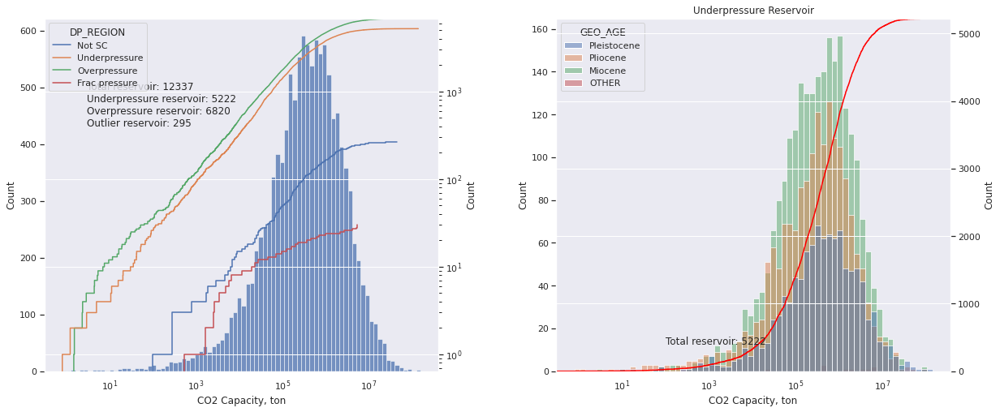

In [ ]:
# create a figure
fig = plt.figure()
# to change size of subplot's
# set height of each subplot as 8
fig.set_figheight(8)
# set width of each subplot as 8
fig.set_figwidth(20)
# create grid for different subplots
spec = gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[1, 1], wspace=0.3,
                         )
ax0 = fig.add_subplot(spec[0])
g=sns.histplot(x='Capacity',data=ISG_df_hasdata,log_scale=True,ax=ax0,stat='count')
g.set_xscale('log')
g.set_xlabel('CO2 Capacity, ton')
ax1=ax0.twinx()
g1=sns.ecdfplot(x='Capacity',data=ISG_df_hasdata,log_scale=True,ax=ax1,color='red',stat='count',hue='DP_REGION')
ax0.grid(False)
text1 = ''.join(['Total reservoir: ', str(len(ISG_df_hasdata)), '\n',
                'Underpressure reservoir: ', str(len(ISG_df_hasdata.loc[ISG_df_hasdata.DP_REGION=='Underpressure'])),'\n',
                'Overpressure reservoir: ', str(len(ISG_df_hasdata.loc[ISG_df_hasdata.DP_REGION=='Overpressure'])),'\n',
                'Outlier reservoir: ', str(len(ISG_df_hasdata.loc[(ISG_df_hasdata.DP_REGION !='Underpressure') & (ISG_df_hasdata.DP_REGION !='Overpressure')]))])
plt.text(3,400,text1)
g1.set_yscale('log')
                

ax2 = fig.add_subplot(spec[1])
gg=sns.histplot(x='Capacity',data=ISG_df_hasdata.loc[ISG_df_hasdata.DP_REGION=='Underpressure'],log_scale=True,ax=ax2,stat='count',hue='GEO_AGE')
sns.move_legend(gg, "upper left")
gg.set_xscale('log')
gg.set_xlabel('CO2 Capacity, ton')
ax3=ax2.twinx()
gg1=sns.ecdfplot(x='Capacity',data=ISG_df_hasdata.loc[ISG_df_hasdata.DP_REGION=='Underpressure'],log_scale=True,ax=ax3,color='red',stat='count')
ax2.grid(False)
plt.text(100,400,'Total reservoir: '+ str(len(ISG_df_hasdata.loc[ISG_df_hasdata.DP_REGION=='Underpressure'])))
plt.title('Underpressure Reservoir')

plt.show()

## CO2 capacity greater than 1 million ton

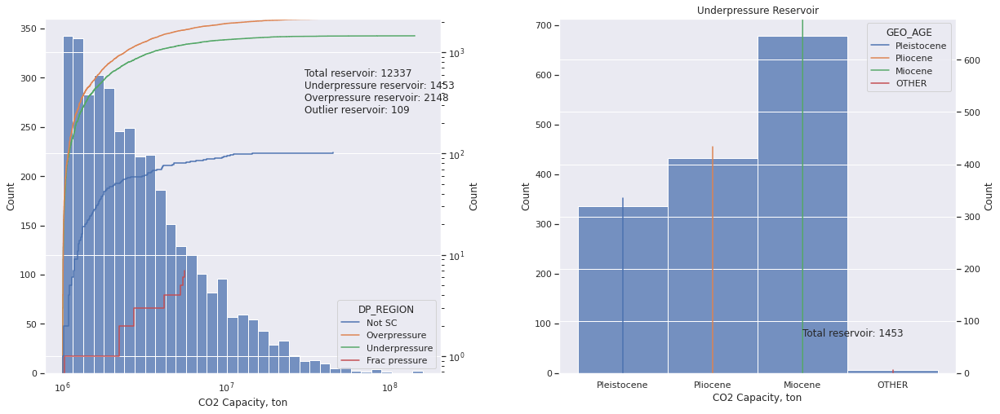

In [ ]:
# create a figure
fig = plt.figure()
# to change size of subplot's
# set height of each subplot as 8
fig.set_figheight(8)
# set width of each subplot as 8
fig.set_figwidth(20)
# create grid for different subplots
spec = gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[1, 1], wspace=0.3,
                         )
ax0 = fig.add_subplot(spec[0])
g=sns.histplot(x='Capacity',data=ISG_df_hasdata.loc[ISG_df_hasdata.Capacity>1000000],log_scale=True,ax=ax0,stat='count')
g.set_xscale('log')
g.set_xlabel('CO2 Capacity, ton')
ax1=ax0.twinx()
g1=sns.ecdfplot(x='Capacity',data=ISG_df_hasdata.loc[ISG_df_hasdata.Capacity>1000000],log_scale=True,ax=ax1,color='red',stat='count',hue='DP_REGION')
ax0.grid(False)
text1 = ''.join(['Total reservoir: ', str(len(ISG_df_hasdata)), '\n',
                'Underpressure reservoir: ', str(len(ISG_df_hasdata.loc[(ISG_df_hasdata.DP_REGION=='Underpressure') & (ISG_df_hasdata.Capacity>1000000)])),'\n',
                'Overpressure reservoir: ', str(len(ISG_df_hasdata.loc[(ISG_df_hasdata.DP_REGION=='Overpressure') & (ISG_df_hasdata.Capacity>1000000)])),'\n',
                'Outlier reservoir: ', str(len(ISG_df_hasdata.loc[(ISG_df_hasdata.DP_REGION !='Underpressure') & (ISG_df_hasdata.DP_REGION !='Overpressure') & (ISG_df_hasdata.Capacity>1000000)]))])
plt.text(30000000,250,text1)
g1.set_yscale('log')
                

ax2 = fig.add_subplot(spec[1])
gg=sns.histplot(x='GEO_AGE',data=ISG_df_hasdata.loc[(ISG_df_hasdata.DP_REGION=='Underpressure') & (ISG_df_hasdata.Capacity>1000000)],log_scale=False,ax=ax2,stat='count')

#gg.set_xscale('log')
gg.set_xlabel('CO2 Capacity, ton')
ax3=ax2.twinx()
gg1=sns.ecdfplot(x='GEO_AGE',data=ISG_df_hasdata.loc[(ISG_df_hasdata.DP_REGION=='Underpressure') & (ISG_df_hasdata.Capacity>1000000)],log_scale=False,ax=ax3,color='red',stat='count',hue='GEO_AGE')

sns.move_legend(gg1, "upper right")
ax2.grid(False)
plt.text('Miocene',70,'Total reservoir: '+ str(len(ISG_df_hasdata.loc[(ISG_df_hasdata.DP_REGION=='Underpressure') & (ISG_df_hasdata.Capacity>1000000)])))
plt.title('Underpressure Reservoir')

plt.show()

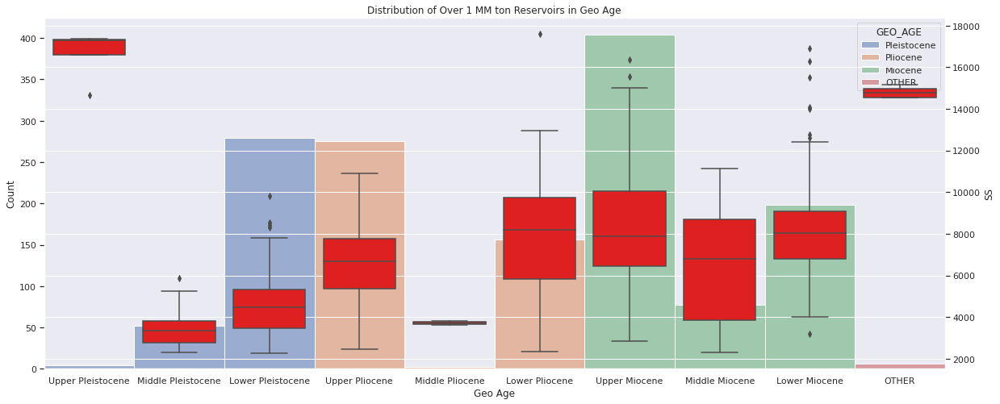

In [ ]:
# GEO_AGE distribution of CO2 capacity > 1 MM ton candidates
_,ax0 = plt.subplots(figsize=(20,8))
gg=sns.histplot(x='GEO_AGE_Detail',data=ISG_df_hasdata.loc[(ISG_df_hasdata.DP_REGION=='Underpressure') & (ISG_df_hasdata.Capacity>1000000)],ax=ax0,stat='count',hue='GEO_AGE')
gg.set_xlabel('Geo Age')
ax1=ax0.twinx()
gg1=sns.boxplot(x='GEO_AGE_Detail', y='SS', data=ISG_df_hasdata.loc[(ISG_df_hasdata.DP_REGION=='Underpressure') & (ISG_df_hasdata.Capacity>1000000)],ax=ax1,color='red')
#sns.move_legend(gg1, "upper right")
ax0.grid(False)


plt.title('Distribution of Over 1 MM ton Reservoirs in Geo Age')

plt.show()

In [ ]:
data_des=ISG_df_hasdata.loc[(ISG_df_hasdata.DP_REGION=='Underpressure') & (ISG_df_hasdata.Capacity>1000000)]
des_SS = data_des.groupby('GEO_AGE_Detail')
des_SS.SS.describe()

,count,mean,std,min,25%,50%,75%,max
GEO_AGE_Detail,,,,,,,,
Lower Miocene,198.0,8148.833333,2050.856604,3210.0,6793.50,8026.0,9073.75,16927.0
Lower Pleistocene,279.0,4525.129032,1310.486962,2282.0,3468.50,4455.0,5309.50,9811.0
Lower Pliocene,156.0,7853.384615,2567.440713,2353.0,5835.50,8179.5,9737.50,17600.0
Middle Miocene,77.0,6430.194805,2825.209760,2300.0,3850.00,6802.0,8706.00,11143.0
Middle Pleistocene,52.0,3357.480769,750.334500,2300.0,2764.25,3367.0,3800.00,5850.0
Middle Pliocene,2.0,3712.000000,125.865007,3623.0,3667.50,3712.0,3756.50,3801.0
OTHER,6.0,14802.833333,270.697186,14548.0,14560.50,14782.5,14988.75,15160.0
Upper Miocene,404.0,8192.663366,2584.981937,2847.0,6453.75,7878.5,10039.50,16354.0
Upper Pleistocene,4.0,16657.500000,1340.556228,14648.0,16619.00,17294.5,17333.00,17393.0


In [ ]:
# Label Candidates
ISG_df_hasdata['Candidates'] = 'No'
ISG_df_hasdata.Candidates.loc[(ISG_df_hasdata.DP_REGION=='Underpressure') & (ISG_df_hasdata.Capacity>1000000)] = 'Yes'

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:214: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0.0, flags=flags)
/usr/local/lib/python3.7/dist-packages/matplotlib/backends/backend_agg.py:183: RuntimeWarning: Glyph 9 missing from current font.
  font.set_text(s, 0, flags=flags)


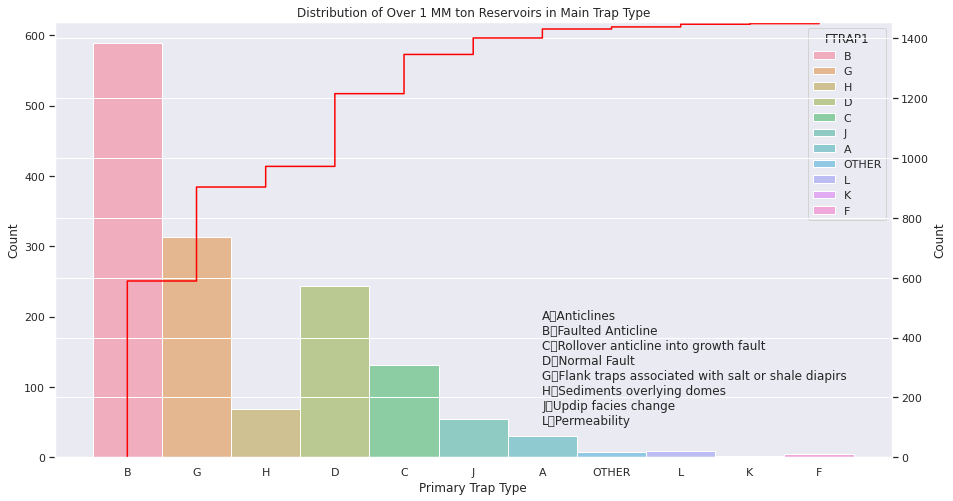

In [ ]:
# GEO_AGE distribution of CO2 capacity > 1 MM ton candidates
_,ax0 = plt.subplots(figsize=(15,8))
gg=sns.histplot(x='FTRAP1',data=ISG_df_hasdata.loc[(ISG_df_hasdata.DP_REGION=='Underpressure') & (ISG_df_hasdata.Capacity>1000000)],ax=ax0,stat='count',hue='FTRAP1')
gg.set_xlabel('Primary Trap Type')
ax1=ax0.twinx()
gg1=sns.ecdfplot(x='FTRAP1',data=ISG_df_hasdata.loc[(ISG_df_hasdata.DP_REGION=='Underpressure') & (ISG_df_hasdata.Capacity>1000000)],ax=ax1,color='red',stat='count')
#sns.move_legend(gg1, "upper right")
ax0.grid(False)


plt.text('A',60,'''
A	Anticlines
B	Faulted Anticline
C	Rollover anticline into growth fault
D	Normal Fault
G	Flank traps associated with salt or shale diapirs
H	Sediments overlying domes
J	Updip facies change
L	Permeability
''')
plt.title('Distribution of Over 1 MM ton Reservoirs in Main Trap Type')
plt.show()

### Results:
### -





[-97.11826202, '\n', -87.66263991, '\n', 26.02462483, '\n', 30.18950905]


/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


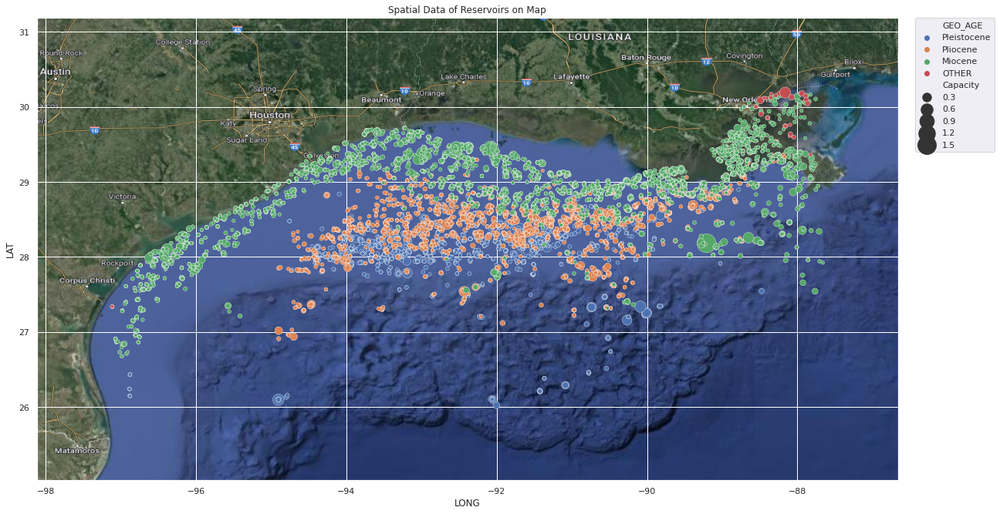

In [ ]:
# Check location of reservoirs
ISG_df_hasdata_map = ISG_df_hasdata.loc[ISG_df_hasdata['LONG'].notnull()]
ISG_df_hasdata_map = ISG_df_hasdata_map.loc[ISG_df_hasdata_map['LONG']!=0]
ISG_df_hasdata_map = ISG_df_hasdata_map.loc[ISG_df_hasdata_map['Capacity'].notnull()]
rangex_min = ISG_df_hasdata_map['LONG'].min()
rangex_max = ISG_df_hasdata_map['LONG'].max()
rangey_min = ISG_df_hasdata_map['LAT'].min()
rangey_max = ISG_df_hasdata_map['LAT'].max()

print([rangex_min , "\n" ,rangex_max, "\n" ,rangey_min , "\n" , rangey_max])
BBox = ((rangex_min-1,   rangex_max+1,      
         rangey_min-1, rangey_max+1))
ISG_df_hasdata_map['GEO_AGE'].unique()

ruh_m = plt.imread('Geomap.png')
fig, ax = plt.subplots(figsize = (20,20))
#ISG_df_hasdata_map.rename(columns={'Capacity':'Capacity, ton'},inplace=True)
size = ISG_df_hasdata_map['Capacity']

color = {'Pleistocene',
       'Pliocene',
       'Miocene'}

sns.scatterplot(ISG_df_hasdata_map['LONG'], ISG_df_hasdata_map['LAT'], zorder=3, alpha= 1, size=size,sizes=(20,600), hue = ISG_df_hasdata_map['GEO_AGE'],cmap='seismic',ax=ax)
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
ax.set_title('Spatial Data of Reservoirs on Map')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])
ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal')

In [ ]:
ISG_df_hasdata_map['Capacity'].describe()

count    1.233700e+04
mean     1.590024e+06
std      4.574115e+06
min      8.031952e-01
25%      9.134281e+04
50%      3.714495e+05
75%      1.304071e+06
max      1.585479e+08
Name: Capacity, dtype: float64

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  if sys.path[0] == '':
/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


[-97.07302114, '\n', -87.78074824, '\n', 26.02462483, '\n', 30.18109942]


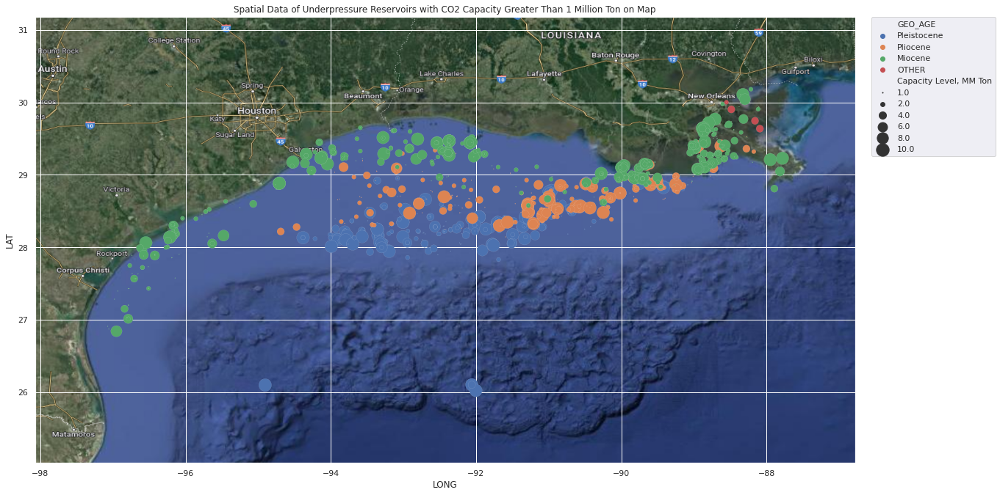

In [ ]:
# Check location of reservoirs
ISG_df_hasdata_map_1MT = ISG_df_hasdata.loc[(ISG_df_hasdata.Capacity>1000000) & (ISG_df_hasdata.DP_REGION=='Underpressure')]
# Label data based on capacity
ISG_df_hasdata_map_1MT['Capacity Level, MM Ton'] = np.select(
    [ISG_df_hasdata_map_1MT['Capacity'] < 2000000,
     ISG_df_hasdata_map_1MT['Capacity'] > 10000000,
     ISG_df_hasdata_map_1MT['Capacity'].between(2000000, 4000000),
     ISG_df_hasdata_map_1MT['Capacity'].between(4000000, 6000000),
     ISG_df_hasdata_map_1MT['Capacity'].between(6000000, 8000000),
     ISG_df_hasdata_map_1MT['Capacity'].between(8000000, 10000000)],
    [1, 10, 2, 4, 6, 8],
    np.nan
)

rangex_min = ISG_df_hasdata_map_1MT['LONG'].min()
rangex_max = ISG_df_hasdata_map_1MT['LONG'].max()
rangey_min = ISG_df_hasdata_map_1MT['LAT'].min()
rangey_max = ISG_df_hasdata_map_1MT['LAT'].max()

print([rangex_min , "\n" ,rangex_max, "\n" ,rangey_min , "\n" , rangey_max])
BBox = ((rangex_min-1,   rangex_max+1,      
         rangey_min-1, rangey_max+1))

ruh_m = plt.imread('Geomap.png')
fig, ax = plt.subplots(figsize = (20,20))
#ISG_df_hasdata_map.rename(columns={'Capacity':'Capacity, ton'},inplace=True)
s = ISG_df_hasdata_map_1MT['Capacity Level, MM Ton']

color = {'Pleistocene',
       'Pliocene',
       'Miocene'}

sc=sns.scatterplot(ISG_df_hasdata_map_1MT['LONG'], ISG_df_hasdata_map_1MT['LAT'], zorder=3, alpha= 1, size=s,sizes=(1,300), hue = ISG_df_hasdata_map_1MT['GEO_AGE'],cmap='seismic',ax=ax)
ax.legend(bbox_to_anchor=(1.02, 1), loc='upper left', borderaxespad=0)
ax.set_title('Spatial Data of Underpressure Reservoirs with CO2 Capacity Greater Than 1 Million Ton on Map')
ax.set_xlim(BBox[0],BBox[1])
ax.set_ylim(BBox[2],BBox[3])

ax.imshow(ruh_m, zorder=0, extent = BBox, aspect= 'equal')

In [ ]:
ISG_df_hasdata_map_1MT.describe()

,WDEP,Recoverable Oil,Recoverable Gas,Recoverable BOE,Cum Oil,Cum Gas,Cum BOE,Oil Reserves,Gas Reserves,BOE Reserves,...,BOI,OIP,GIP,ORF,LAT,LONG,Max_Vol,Density,Capacity,"Capacity Level, MM Ton"
count,1453.000000,1.453000e+03,1.453000e+03,1.453000e+03,1.453000e+03,1.453000e+03,1.453000e+03,1.453000e+03,1.453000e+03,1.453000e+03,...,1453.000000,1.453000e+03,1.453000e+03,1453.000000,1453.000000,1453.000000,1453.000000,1453.000000,1.453000e+03,1453.000000
mean,170.916724,3.551641e+06,3.578666e+07,9.919374e+06,3.425614e+06,3.532308e+07,9.710859e+06,1.260274e+05,4.635805e+05,2.085150e+05,...,0.473086,8.309984e+06,5.496002e+07,0.131019,28.780627,-91.512402,214.495581,41.925926,4.424325e+06,2.822436
std,479.732231,9.861119e+06,6.718946e+07,1.621177e+07,9.007271e+06,6.646145e+07,1.532080e+07,1.854434e+06,4.882684e+06,2.490688e+06,...,0.663565,2.778785e+07,1.006528e+08,0.200670,0.532160,2.123717,397.895364,3.276644,7.915076e+06,2.723506
min,10.000000,0.000000e+00,2.980999e+06,9.093510e+05,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000,0.000000e+00,0.000000e+00,0.000000,26.024625,-97.073021,45.777730,29.858517,1.000243e+06,1.000000
25%,57.000000,8.202000e+03,1.154888e+07,2.633619e+06,7.934000e+03,1.135324e+07,2.610185e+06,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000,0.000000e+00,1.630615e+07,0.000000,28.418942,-92.800985,69.223427,41.448203,1.443379e+06,1.000000
50%,119.000000,1.140830e+05,1.838134e+07,5.093600e+06,1.135970e+05,1.809045e+07,5.001899e+06,0.000000e+00,0.000000e+00,0.000000e+00,...,0.000000,0.000000e+00,2.990834e+07,0.000000,28.812585,-91.282909,109.809745,43.700000,2.280124e+06,2.000000
75%,200.000000,2.830599e+06,3.403574e+07,1.045247e+07,2.687488e+06,3.388822e+07,1.040017e+07,2.889000e+03,3.215400e+04,2.704000e+04,...,1.288000,6.593922e+06,5.658446e+07,0.300000,29.162983,-89.758649,202.206605,43.700000,4.245684e+06,4.000000
max,7915.000000,1.687892e+08,1.171703e+09,2.316469e+08,1.312666e+08,1.171049e+09,2.145645e+08,5.834396e+07,1.345719e+08,6.979417e+07,...,2.105000,7.425593e+08,1.854120e+09,0.700000,30.181099,-87.780748,7457.960690,43.700000,1.418566e+08,10.000000


# If we can decide the conductivity of faults based on data exploration

In [ ]:
# 1. How many reservoirs not fully recovered?
Cross_Data = ISG_df_hasdata.copy()
Cross_Data.columns = [c.replace(' ', '_') for c in Cross_Data.columns]
Cross_Data['BOE_RF'] = Cross_Data['Cum_BOE']/Cross_Data['Recoverable_BOE']
Fully_Recovered = Cross_Data.loc[(Cross_Data.Oil_Reserves == 0) & (Cross_Data.Gas_Reserves == 0)]
Partial_Recovered = Cross_Data[~Cross_Data.isin(Fully_Recovered)].dropna()
Total = len(Cross_Data)

print('not fully recovered: ' + str(Total-len(Fully_Recovered)))


not fully recovered: 2718


In [ ]:
len(Partial_Recovered)/Total

0.22031287995460808

In [ ]:
FoF = Fully_Recovered.groupby(by=["FTRAP1"]).count()/Cross_Data.groupby(by=["FTRAP1"]).count()
Fof = FoF.Cum_BOE
Fof.values

array([0.70558376, 0.8185941 , 0.83633935, 0.85249879, 0.27027027,
       0.38333333, 0.66123982, 0.84664132, 0.83900929, 0.70535714,
       0.94736842, 0.51724138, 0.25806452])

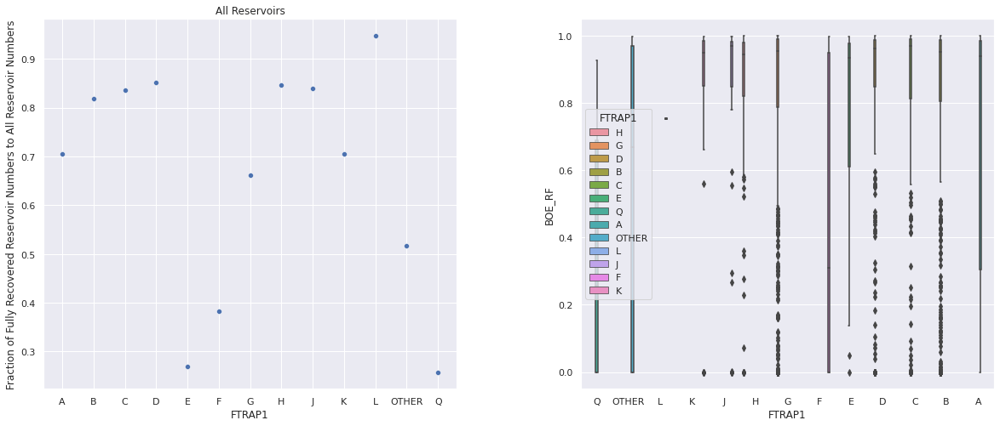

In [ ]:
# 2. Is there relationship between trap type and recovery status
fig = plt.figure()
# to change size of subplot's
# set height of each subplot as 8
fig.set_figheight(8)
# set width of each subplot as 8
fig.set_figwidth(20)
# create grid for different subplots
spec = gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[1, 1], wspace=0.3,
                         )
ax0 = fig.add_subplot(spec[0])
my_order = Cross_Data.groupby(by=["FTRAP1"])["BOE_RF"].median().iloc[::-1].index

gg=sns.scatterplot(x=Fof.keys(), y=Fof.values,ax=ax0)
for container in ax0.containers:
    print(container[0])
    ax0.bar_label(container)
    
ax1 = fig.add_subplot(spec[1])
gg1=sns.boxplot(x='FTRAP1',y="BOE_RF", data=Partial_Recovered,hue='FTRAP1',ax=ax1,order=my_order)

gg.set_title('All Reservoirs')
gg.set_ylabel('Fraction of Fully Recovered Reservoir Numbers to All Reservoir Numbers')
for container in ax0.containers:
    ax0.bar_label(container,)


plt.show()

Text(0.5, 1.0, 'Not Fully Reservoirs')

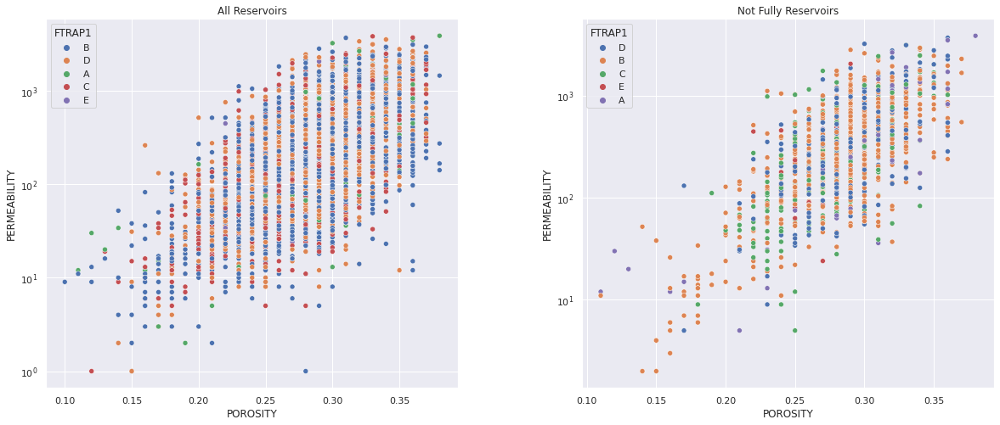

In [ ]:
fig = plt.figure()
# to change size of subplot's
# set height of each subplot as 8
fig.set_figheight(8)
# set width of each subplot as 8
fig.set_figwidth(20)
# create grid for different subplots
spec = gridspec.GridSpec(ncols=2, nrows=1,
                         width_ratios=[1, 1], wspace=0.3,
                         )
fault=['A','B','C','D','E']
ax0 = fig.add_subplot(spec[0])
g=sns.scatterplot(x='POROSITY',y="PERMEABILITY", data=Cross_Data.loc[Cross_Data.FTRAP1.isin(fault)],hue='FTRAP1',ax=ax0)
g.set_yscale('log')
g.set_title('All Reservoirs')
ax1 = fig.add_subplot(spec[1])
g1=sns.scatterplot(x='POROSITY',y="PERMEABILITY", data=Partial_Recovered.loc[Partial_Recovered.FTRAP1.isin(fault)],hue='FTRAP1',ax=ax1)
g1.set_yscale('log')
g1.set_title('Not Fully Reservoirs')

# %%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%%

# This section, we train the ML model to check factors' ranking on capacity

In [ ]:
# Remove 0 data entries
# Total 7248 non-null data entries
Train_df = ISG_df_hasdata.loc[ISG_df_hasdata['Capacity'].notnull()]
Train_df.reset_index(drop=True, inplace = True)
Train_df.head()

,BOEM_FIELD,FSTRUC,FTRAP1,SAND,CHRONOZONE,SD_TYPE,WDEP,Recoverable Oil,Recoverable Gas,Recoverable BOE,...,LAT,LONG,GEO_AGE,GEO_AGE_Detail,Max_Vol,CAND,DP_REGION,Density,Capacity,Candidates
0,EI292,A,B,BB,PLU,G,214,42,2298344,409000,...,28.279079,-91.723379,Pleistocene,Upper Pleistocene,34.720399,Not SC,Not SC,26.945347,4.677766e+05,No
1,EI306,A,B,1200,PLU,G,223,0,7511651,1336593,...,28.326146,-91.605724,Pleistocene,Upper Pleistocene,198.658104,Not SC,Not SC,18.547515,1.842307e+06,No
2,EI306,A,B,1800,PLU,G,223,0,15398474,2739942,...,28.328047,-91.611446,Pleistocene,Upper Pleistocene,251.647777,Not SC,Not SC,26.180900,3.294183e+06,No
3,EI325,D,H,AD,PLU,G,253,57,2609714,464419,...,28.244522,-91.435920,Pleistocene,Upper Pleistocene,71.104009,Not SC,Not SC,19.766483,7.027381e+05,No
4,EI325,D,H,AE,PLU,G,253,1951,36934596,6573943,...,28.244270,-91.457429,Pleistocene,Upper Pleistocene,810.337141,Not SC,Not SC,23.354916,9.462678e+06,No


In [ ]:
Train_df.drop(['BOEM_FIELD','SAND','CHRONOZONE','Cum BOE','BOE Reserves','OIP','GIP','ORF','GEO_AGE','SS', 'FSTRUC','GEO_AGE','THK', 'TAREA', 'TVOL', 'BGI', 'BOI','Recoverable Oil', 'Recoverable Gas', 'Recoverable BOE','Max_Vol','CAND','DP_REGION','Density','PI','TI', 'Capacity','Candidates'],axis=1,inplace=True)

In [ ]:
# Set parameters
params = Train_df.columns
cat_par = ['FTRAP1','SD_TYPE','GEO_AGE_Detail','DRIVE']
Obj = 'Capacity'
Train_df.head()


,FTRAP1,SD_TYPE,WDEP,Cum Oil,Cum Gas,Oil Reserves,Gas Reserves,OTHK,GTHK,DRIVE,...,SDPG,SDTG,RSI,YIELD,GOR,SPGR,API,LAT,LONG,GEO_AGE_Detail
0,B,G,214,42,2298344,0,0,0.0,16.03,UNK,...,0.493,1.639,0,0.018,54722.47619,0.59,0,28.279079,-91.723379,Upper Pleistocene
1,B,G,223,0,7511651,0,0,0.0,12.80,PARWTR,...,0.473,1.182,0,0.000,0.00000,0.65,0,28.326146,-91.605724,Upper Pleistocene
2,B,G,223,0,15398474,0,0,0.0,24.10,PARWTR,...,0.473,1.222,0,0.000,0.00000,0.57,0,28.328047,-91.611446,Upper Pleistocene
3,H,G,253,57,2609714,0,0,0.0,14.20,WTR,...,0.438,1.597,0,0.022,45784.45614,0.56,0,28.244522,-91.435920,Upper Pleistocene
4,H,G,253,1951,36934596,0,0,0.0,20.90,WTR,...,0.432,1.600,0,0.053,18931.11020,0.58,0,28.244270,-91.457429,Upper Pleistocene


In [ ]:
sns.set()

numCol = []
for col in Train_df:
  if Train_df[col].dtype == np.float:
    numCol.append(col)

corr_score = Train_df[numCol].corr()
corr_score

/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:5: DeprecationWarning: `np.float` is a deprecated alias for the builtin `float`. To silence this warning, use `float` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.float64` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations
  """


,OTHK,GTHK,POROSITY,SW,PERMEABILITY,SDPG,SDTG,YIELD,GOR,SPGR,LAT,LONG
OTHK,1.000000,-0.073226,-0.036770,-0.094275,0.037686,0.097949,-0.269560,0.030362,-0.013434,-0.414869,-0.171718,0.233118
GTHK,-0.073226,1.000000,-0.049909,-0.154197,0.103842,0.083895,0.056376,0.091312,0.035642,0.389193,-0.017170,-0.062252
POROSITY,-0.036770,-0.049909,1.000000,-0.259518,0.511327,-0.246193,-0.003385,-0.120444,0.023101,-0.011032,-0.137728,-0.002769
SW,-0.094275,-0.154197,-0.259518,1.000000,-0.677828,-0.022420,0.096859,0.009626,-0.015220,-0.000524,0.046996,-0.013172
PERMEABILITY,0.037686,0.103842,0.511327,-0.677828,1.000000,-0.047898,-0.090454,-0.055889,0.028196,-0.003028,-0.100889,-0.005915
SDPG,0.097949,0.083895,-0.246193,-0.022420,-0.047898,1.000000,-0.048615,0.148168,-0.018992,-0.075850,-0.094314,-0.090860
SDTG,-0.269560,0.056376,-0.003385,0.096859,-0.090454,-0.048615,1.000000,-0.030559,0.006472,0.243311,0.237196,-0.338792
YIELD,0.030362,0.091312,-0.120444,0.009626,-0.055889,0.148168,-0.030559,1.000000,-0.012658,0.205091,0.028732,0.099351
GOR,-0.013434,0.035642,0.023101,-0.015220,0.028196,-0.018992,0.006472,-0.012658,1.000000,0.007522,-0.016892,-0.009425
SPGR,-0.414869,0.389193,-0.011032,-0.000524,-0.003028,-0.075850,0.243311,0.205091,0.007522,1.000000,0.129040,-0.225881


In [ ]:
# Separate X and Y
Y = ISG_df_hasdata[Obj]
X = Train_df.loc[:, Train_df.columns.isin(params)]
X.head()


,FTRAP1,SD_TYPE,WDEP,Cum Oil,Cum Gas,Oil Reserves,Gas Reserves,OTHK,GTHK,DRIVE,...,SDPG,SDTG,RSI,YIELD,GOR,SPGR,API,LAT,LONG,GEO_AGE_Detail
0,B,G,214,42,2298344,0,0,0.0,16.03,UNK,...,0.493,1.639,0,0.018,54722.47619,0.59,0,28.279079,-91.723379,Upper Pleistocene
1,B,G,223,0,7511651,0,0,0.0,12.80,PARWTR,...,0.473,1.182,0,0.000,0.00000,0.65,0,28.326146,-91.605724,Upper Pleistocene
2,B,G,223,0,15398474,0,0,0.0,24.10,PARWTR,...,0.473,1.222,0,0.000,0.00000,0.57,0,28.328047,-91.611446,Upper Pleistocene
3,H,G,253,57,2609714,0,0,0.0,14.20,WTR,...,0.438,1.597,0,0.022,45784.45614,0.56,0,28.244522,-91.435920,Upper Pleistocene
4,H,G,253,1951,36934596,0,0,0.0,20.90,WTR,...,0.432,1.600,0,0.053,18931.11020,0.58,0,28.244270,-91.457429,Upper Pleistocene


In [ ]:
# Splite data into training and testing
# 100 -> 75:y=1, 25:y=0
# training(80): 60 y=1; 20 y=0 
# testing(20):  15 y=1; 5 y=0

# Reserve 25% for testing
# stratify example:
# 100 -> y: 80 '0', 20 '1' -> 4:1
# 80% training 64: '0', 16:'1' -> 4:1
# 20% testing  16:'0', 4: '1' -> 4:1
X_train, X_test, y_train, y_test = model_selection.train_test_split(X, Y, test_size=0.1, random_state=1) #stratify = y :=> stratified sampling 分层抽样 根据y的分类进行分层然后随机抽样, here is regression so no need

print('training data has ' + str(X_train.shape[0]) + ' observation with ' + str(X_train.shape[1]) + ' features')
print('test data has ' + str(X_test.shape[0]) + ' observation with ' + str(X_test.shape[1]) + ' features')

training data has 11103 observation with 23 features
test data has 1234 observation with 23 features


In [ ]:
# One hot encoding(convert string to numbers)
# another way: get_dummies


def OneHotEncoding(df, enc, categories):  
  transformed = pd.DataFrame(enc.transform(df[categories]).toarray(), columns=enc.get_feature_names(categories))
  return pd.concat([df.reset_index(drop=True), transformed], axis=1).drop(categories, axis=1)

categories = cat_par
enc_ohe = OneHotEncoder()
enc_ohe.fit(X_train[categories])

X_train = OneHotEncoding(X_train, enc_ohe, categories)
X_test = OneHotEncoding(X_test, enc_ohe, categories)
######################################################################################################

/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function get_feature_names is deprecated; get_feature_names is deprecated in 1.0 and will be removed in 1.2. Please use get_feature_names_out instead.
  warnings.warn(msg, category=FutureWarning)


Read more for handling [categorical feature](https://github.com/scikit-learn-contrib/categorical-encoding), and there is an awesome package for [encoding](http://contrib.scikit-learn.org/category_encoders/).

In [ ]:
X_train.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11103 entries, 0 to 11102
Data columns (total 53 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   WDEP                               11103 non-null  int64  
 1   Cum Oil                            11103 non-null  int64  
 2   Cum Gas                            11103 non-null  int64  
 3   Oil Reserves                       11103 non-null  int64  
 4   Gas Reserves                       11103 non-null  int64  
 5   OTHK                               11103 non-null  float64
 6   GTHK                               11103 non-null  float64
 7   POROSITY                           11103 non-null  float64
 8   SW                                 11103 non-null  float64
 9   PERMEABILITY                       11103 non-null  float64
 10  SDPG                               11103 non-null  float64
 11  SDTG                               11103 non-null  flo

Standardize/Normalize Data

In [ ]:
# Scale the data, using standardization
# standardization (x-mean)/std
# normalization (x-x_min)/(x_max-x_min) ->[0,1]

# 1. speed up gradient descent
# 2. same scale
# 3. algorithm requirments

# for example, use training data to train the standardscaler to get mean and std 
# apply mean and std to both training and testing data.
# fit_transform does the training and applying, transform only does applying.
# Because we can't use any info from test, and we need to do the same modification
# to testing data as well as training data

# https://scikit-learn.org/stable/auto_examples/preprocessing/plot_all_scaling.html#sphx-glr-auto-examples-preprocessing-plot-all-scaling-py
# https://scikit-learn.org/stable/modules/preprocessing.html


# min-max example: (x-x_min)/(x_max-x_min)
# [1,2,3,4,5,6,100] -> fit(min:1, max:6) (scalar.min = 1, scalar.max = 6) -> transform [(1-1)/(6-1),(2-1)/(6-1)..]
# scalar.fit(train) -> min:1, max:100
# scalar.transform(apply to x) -> apply min:1, max:100 to X_train
# scalar.transform -> apply min:1, max:100 to X_test

# scalar.fit -> mean:1, std:100
# scalar.transform -> apply mean:1, std:100 to X_train
# scalar.transform -> apply mean:1, std:100 to X_test


scaler = StandardScaler()
scaler.fit(X_train)
X_train_np = scaler.transform(X_train)
X_test_np = scaler.transform(X_test)

In [ ]:
# Linear Regression
regression_linear = LinearRegression()

# Logistic Regression
regression_logi = LogisticRegression()

# K Nearest Neighbors
regression_KNN = KNeighborsRegressor()

# Random Forest
regression_RF = RandomForestRegressor()

# Gradient Boosting
regression_GBR = GradientBoostingRegressor(n_estimators=600, 
    max_depth=5, 
    learning_rate=0.01, 
    )

In [ ]:
r1=regression_linear.fit(X_train_np, y_train)

r3=regression_KNN.fit(X_train_np, y_train)
r4=regression_RF.fit(X_train_np, y_train)
r5=regression_GBR.fit(X_train_np, y_train)

# Analysis groupby reservoirs

In [ ]:
DF_R = ISG_df_hasdata[['BOEM_FIELD','PI','TI','SS','GEO_AGE','FTRAP1','DP_REGION']].copy()
DF_R_2 = ISG_df_hasdata[['BOEM_FIELD','Capacity']].copy()
df_r = DF_R.groupby('BOEM_FIELD').first()
df_r_2 = DF_R_2.groupby('BOEM_FIELD').sum()
df_R = df_r.merge(df_r_2, how='left', on='BOEM_FIELD')
df_R

,PI,TI,SS,GEO_AGE,FTRAP1,DP_REGION,Capacity
BOEM_FIELD,,,,,,,
AC024,6873,135,12700,Pliocene,K,Overpressure,2.113107e+06
AC025,6883,141,12719,Pliocene,B,Overpressure,2.053853e+07
AC065,6583,102,10983,Pliocene,K,Overpressure,3.324399e+06
AC857,7090,171,14648,Pleistocene,B,Underpressure,6.950428e+07
AC859,9487,110,17348,Pleistocene,B,Overpressure,8.866235e+06
...,...,...,...,...,...,...,...
WR469,18800,239,25297,Pleistocene,A,Overpressure,3.974715e+06
WR508,19050,250,26474,Pleistocene,B,Overpressure,8.997294e+06
WR627,21114,223,28245,Pleistocene,B,Overpressure,7.799789e+06


# Classification Model

In [ ]:
# Define Data Base
DF_Classification = ISG_df_hasdata.copy()

## Top 10 Influencing factors

In [ ]:
# Based on ML feature importance:
# Select top 10 important features
# Cum Gas : 0.8267
# Cum Oil : 0.039
# Oil Reserves : 0.0225
# SDTG : 0.022
# SDPG : 0.0178
# YIELD : 0.0154
# Gas Reserves : 0.0113
# GOR : 0.0093
# SPGR : 0.0061
# GTHK : 0.0033
DF_R = DF_Classification[['BOEM_FIELD','Cum Gas','Cum Oil','Oil Reserves','Gas Reserves','GTHK','Capacity']].copy()
DF_R_2 = DF_Classification[['BOEM_FIELD','SDTG','SDPG','YIELD','GOR','SPGR']].copy()
DF_R_3 = DF_Classification[['BOEM_FIELD','DP_REGION','Candidates']].copy()
df_r = DF_R.groupby('BOEM_FIELD').sum()
df_r_2 = DF_R_2.groupby('BOEM_FIELD').mean()
df_r_3 = DF_R_3.groupby('BOEM_FIELD').first()
df_R = df_r.merge(df_r_2, how='left', on='BOEM_FIELD')
df_C = df_R.merge(df_r_3, how='left', on='BOEM_FIELD')
df_C

,Cum Gas,Cum Oil,Oil Reserves,Gas Reserves,GTHK,Capacity,SDTG,SDPG,YIELD,GOR,SPGR,DP_REGION,Candidates
BOEM_FIELD,,,,,,,,,,,,,
AC024,8403079,12202525,642790,460188,0.0,2.113107e+06,0.74800,0.5400,0.000,0.690000,0.0,Overpressure,No
AC025,89135755,78811154,10232824,8475199,0.0,2.053853e+07,0.79400,0.5400,0.000,1.096211,0.0,Overpressure,No
AC065,49087574,1231565,0,0,13.2,3.324399e+06,0.56500,0.5980,25.089,39.857883,0.6,Overpressure,No
AC857,256632364,138367878,79600182,183042027,0.0,6.950428e+07,0.70720,0.4926,0.000,1.474981,0.0,Underpressure,Yes
AC859,28213357,17111328,13223362,15957194,0.0,8.866235e+06,0.33350,0.5175,0.000,2.053500,0.0,Overpressure,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...
WR469,2794741,20002647,7032356,882019,0.0,3.974715e+06,0.78700,0.7430,0.000,0.136000,0.0,Overpressure,No
WR508,1232733,7905551,59903204,9544148,0.0,8.997294e+06,0.80980,0.7174,0.000,0.163400,0.0,Overpressure,No
WR627,738546,7681437,51954524,7376401,0.0,7.799789e+06,0.65260,0.7356,0.000,0.133600,0.0,Overpressure,No


In [6]:
df_C = pd.read_csv('tempresult2.csv')

In [13]:
# Modify Candidates based on reservoirs over 10 MM ton
df_C['Candidates'] = 'NO'
df_C['Candidates'].iloc[(df_C.CS>60)] = 'Yes'

/usr/local/lib/python3.8/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [14]:
y_c = df_C.Candidates
x_c = df_C.drop(columns=['BOEM_FIELD','CS','Candidates'])

# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy")

# Train Decision Tree Classifer
clf = clf.fit(x_c,y_c)

#Predict the response for test dataset
y_pred = clf.predict(x_c)

# ONLY APPY in GOOGLE COLAB
cols_names=x_c.columns
dot_data = StringIO()
class_name=np.unique(y_c)
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = cols_names,class_names=class_name)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  


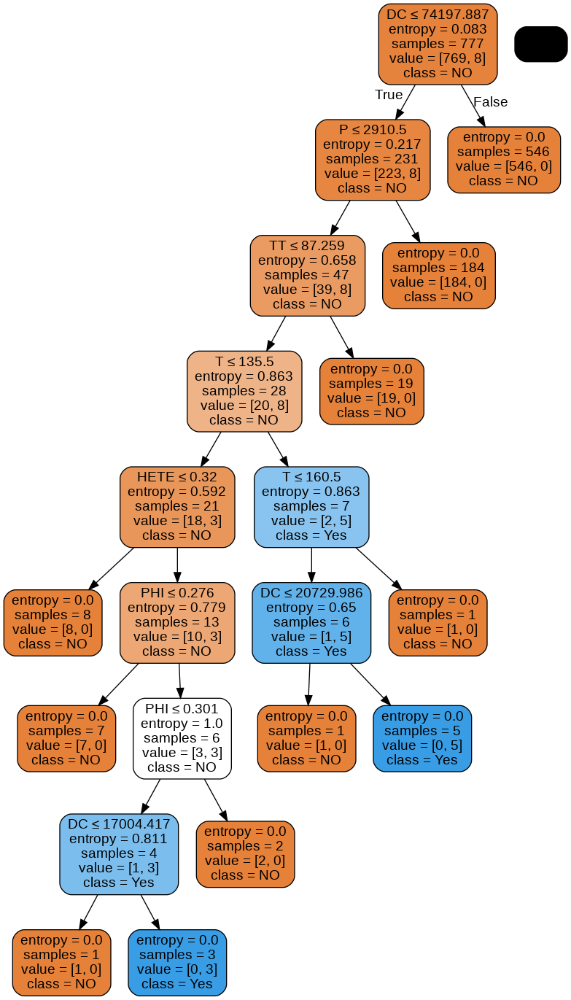

In [15]:
graph.write_png('diabetes.png')
Image(graph.create_png())

## Top 12 Geology Influencing factors

In [ ]:
# Based on ML feature importance:
# Select top 10 geological important features
#SDTG : 0.022
#SDPG : 0.0178
#YIELD : 0.0154
#SPGR : 0.0061
#GTHK : 0.0033
#WDEP : 0.0032
#LONG : 0.003
#PERMEABILITY : 0.0029
#OTHK : 0.0026
#POROSITY : 0.0026
#LAT : 0.0017
#SW : 0.0012
########## Sum
DF_R1 = DF_Classification[['BOEM_FIELD','Capacity','OTHK','WDEP','GTHK']].copy()
########## Mean
DF_R1_2 = DF_Classification[['BOEM_FIELD','SDTG','SDPG','YIELD','SW','POROSITY','PERMEABILITY','LONG','LAT']].copy()
########## First
DF_R1_3 = DF_Classification[['BOEM_FIELD','DP_REGION','Candidates']].copy()
df_r1 = DF_R1.groupby('BOEM_FIELD').sum()
df_r1_2 = DF_R1_2.groupby('BOEM_FIELD').mean()
df_r1_3 = DF_R1_3.groupby('BOEM_FIELD').first()
df_R1 = df_r1.merge(df_r1_2, how='left', on='BOEM_FIELD')
df1_C = df_R1.merge(df_r1_3, how='left', on='BOEM_FIELD')
df1_C

,Capacity,OTHK,WDEP,GTHK,SDTG,SDPG,YIELD,SW,POROSITY,PERMEABILITY,LONG,LAT,DP_REGION,Candidates
BOEM_FIELD,,,,,,,,,,,,,,
AC024,2.113107e+06,35.76,4856,0.0,0.74800,0.5400,0.000,0.1200,0.3100,1258.00,-94.761114,26.953626,Overpressure,No
AC025,2.053853e+07,65.07,4807,0.0,0.79400,0.5400,0.000,0.1700,0.3400,1315.00,-94.700647,26.938899,Overpressure,No
AC065,3.324399e+06,0.00,4852,13.2,0.56500,0.5980,25.089,0.2800,0.3200,340.00,-94.901055,26.910753,Overpressure,No
AC857,6.950428e+07,380.62,39575,0.0,0.70720,0.4926,0.000,0.2520,0.2280,281.20,-94.904182,26.099745,Underpressure,Yes
AC859,8.866235e+06,110.75,18808,0.0,0.33350,0.5175,0.000,0.1850,0.3150,1043.00,-94.793220,26.145615,Overpressure,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WR469,3.974715e+06,131.51,8842,0.0,0.78700,0.7430,0.000,0.3100,0.2300,31.00,-90.540722,26.516008,Overpressure,No
WR508,8.997294e+06,325.97,46175,0.0,0.80980,0.7174,0.000,0.3440,0.1920,15.00,-90.776031,26.462040,Overpressure,No
WR627,7.799789e+06,620.61,35670,0.0,0.65260,0.7356,0.000,0.2780,0.1760,18.20,-91.366376,26.383878,Overpressure,No


In [ ]:

# Modify Candidates based on reservoirs over 10 MM ton
df1_C.Candidates = 'NO'


In [ ]:
df1_C.Candidates.iloc[(df1_C.DP_REGION == 'Underpressure') & (df1_C.Capacity >= 50000000)] = 'C.R.'

/usr/local/lib/python3.7/dist-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)


In [ ]:
df1_C

,Capacity,OTHK,WDEP,GTHK,SDTG,SDPG,YIELD,SW,POROSITY,PERMEABILITY,LONG,LAT,DP_REGION,Candidates
BOEM_FIELD,,,,,,,,,,,,,,
AC024,2.113107e+06,35.76,4856,0.0,0.74800,0.5400,0.000,0.1200,0.3100,1258.00,-94.761114,26.953626,Overpressure,NO
AC025,2.053853e+07,65.07,4807,0.0,0.79400,0.5400,0.000,0.1700,0.3400,1315.00,-94.700647,26.938899,Overpressure,NO
AC065,3.324399e+06,0.00,4852,13.2,0.56500,0.5980,25.089,0.2800,0.3200,340.00,-94.901055,26.910753,Overpressure,NO
AC857,6.950428e+07,380.62,39575,0.0,0.70720,0.4926,0.000,0.2520,0.2280,281.20,-94.904182,26.099745,Underpressure,C.R.
AC859,8.866235e+06,110.75,18808,0.0,0.33350,0.5175,0.000,0.1850,0.3150,1043.00,-94.793220,26.145615,Overpressure,NO
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
WR469,3.974715e+06,131.51,8842,0.0,0.78700,0.7430,0.000,0.3100,0.2300,31.00,-90.540722,26.516008,Overpressure,NO
WR508,8.997294e+06,325.97,46175,0.0,0.80980,0.7174,0.000,0.3440,0.1920,15.00,-90.776031,26.462040,Overpressure,NO
WR627,7.799789e+06,620.61,35670,0.0,0.65260,0.7356,0.000,0.2780,0.1760,18.20,-91.366376,26.383878,Overpressure,NO


In [ ]:
y_c = pd.Categorical(df1_C.Candidates)
x_c = df1_C.drop(columns=['DP_REGION','Candidates','Capacity'])

# Create Decision Tree classifer object
clf = DecisionTreeClassifier(criterion="entropy",splitter='best',min_samples_split=5)

# Train Decision Tree Classifer
clf = clf.fit(x_c,y_c)

#Predict the response for test dataset
y_pred = clf.predict(x_c)

# ONLY APPY in GOOGLE COLAB
cols_names=x_c.columns
dot_data = StringIO()
class_name=np.unique(y_c)
export_graphviz(clf, out_file=dot_data,  
                filled=True, rounded=True,
                special_characters=True,feature_names = cols_names,class_names=class_name)
graph = pydotplus.graph_from_dot_data(dot_data.getvalue())  


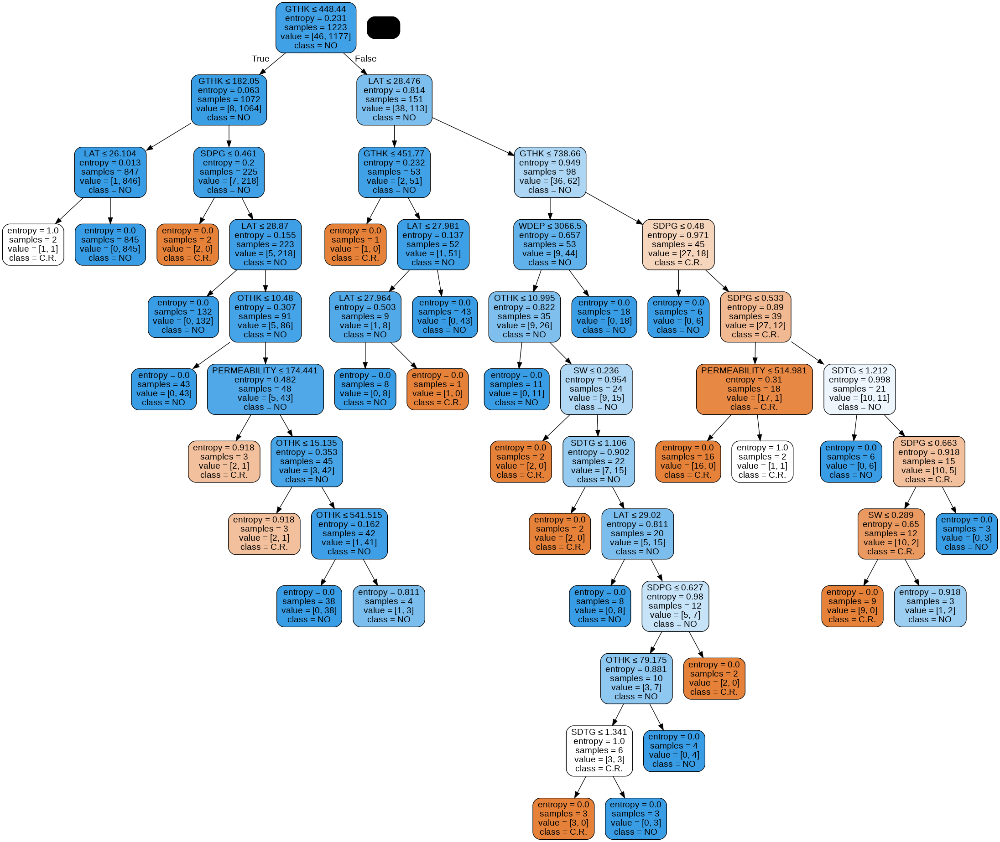

In [ ]:
graph.write_png('diabetes.png')
Image(graph.create_png())

/usr/local/lib/python3.7/dist-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5222 entries, 0 to 5221
Data columns (total 28 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   FTRAP1           5222 non-null   object 
 1   SD_TYPE          5222 non-null   object 
 2   WDEP             5222 non-null   int64  
 3   Recoverable Oil  5222 non-null   int64  
 4   Recoverable Gas  5222 non-null   int64  
 5   Cum Oil          5222 non-null   int64  
 6   Cum Gas          5222 non-null   int64  
 7   Oil Reserves     5222 non-null   int64  
 8   Gas Reserves     5222 non-null   int64  
 9   SS               5222 non-null   int64  
 10  THK              5222 non-null   float64
 11  TAREA            5222 non-null   int64  
 12  OTHK             5222 non-null   float64
 13  GTHK             5222 non-null   float64
 14  DRIVE            5222 non-null   object 
 15  POROSITY         5222 non-null   float64
 16  SW               5222 non-null   float64
 17  PERMEABILITY  

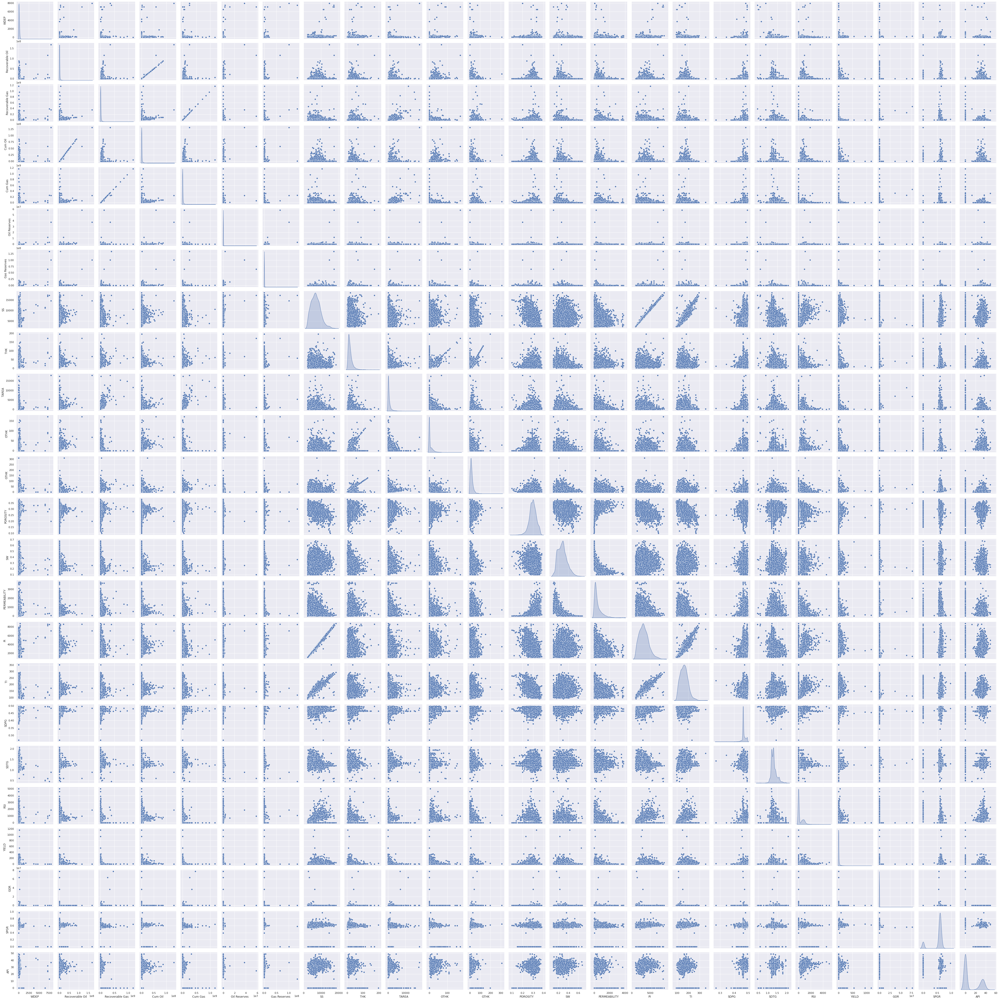

In [ ]:
Train_df = ISG_df_hasdata.loc[ISG_df_hasdata['DP_REGION']=='Underpressure']
Train_df.reset_index(drop=True, inplace = True)
Obj = 'Capacity'
Y = Train_df[Obj]
Train_df.drop(['BOEM_FIELD','SAND','CHRONOZONE','Cum BOE','BOE Reserves','OIP','GIP','ORF','GEO_AGE','FSTRUC','GEO_AGE', 'TVOL', 'BGI', 'BOI', 'Recoverable BOE','Max_Vol','CAND','DP_REGION','Density', 'Capacity','Candidates','LAT','LONG'],axis=1,inplace=True)
Train_df.info()
Petro_Factor = ['Oil Reserves','Gas Reserves', 'Recoverable Oil','Recoverable Gas','Cum Oil','Cum Gas','OTHK','GTHK','SW','RSI','YIELD','GOR']
# check factors inner relationship
sns.pairplot(Train_df, diag_kind='kde')


In [ ]:
sns.pairplot(Train_df.loc[:, ~Train_df.columns.isin(Petro_Factor)], diag_kind='kde')